## Project Workflow
### 1. Importing Necessary Modules
- Loading essential Python libraries for data analysis and visualization.

### 2. Understanding the Data
- Exploring the dataset to understand its structure, features, and types of variables.

### 3. Data Cleaning & Preprocessing
- Fixing rows and columns for better readability.
- Fixing mixed data types to ensure consistency.
- Handling missing values and removing duplicate entries.
- Detecting and treating outliers to improve data quality.
### 4. Exploratory Data Analysis (EDA)
- Univariate Analysis – Examining individual feature distributions.
- Bivariate Analysis – Identifying relationships between two variables.
- Multivariate Analysis – Analyzing interactions among multiple features.
### 5. Merging Previous Application Data
- Combining past application records with the current dataset for deeper insights.

### 6. Conclusion
- Summarizing key findings and insights derived from the analysis.

# 1 Importing necessary Modules

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.impute import SimpleImputer
import warnings
warnings.filterwarnings('ignore')

In [2]:
app=pd.read_csv('application_data.csv')


In [3]:
description=pd.read_csv('columns_description.csv',encoding='ISO-8859-1')

In [4]:
previous_app=pd.read_csv('previous_application.csv',encoding='ISO-8859-1')


# 2 understanding the data

In [6]:
app.head(50) # check first 50 rows

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.000,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.000,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.000,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.000,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.000,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.000,490495.5,27517.5,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.000,1560726.0,41301.0,...,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,0,360000.000,1530000.0,42075.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,0,135000.000,405000.0,20250.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
app.shape # checking rows and columns there are 122 columns and 307511 rows 

(307511, 122)

In [8]:
app.iloc[:,:100].info() # info about data 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 100 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nu

In [9]:
app.info() # there are total 122 columns and in that there are float64(65), int64(41) & object(16)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [10]:
app.describe() # summary of data

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [11]:
app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [12]:
app.duplicated().sum() # there is no duplicates 

0

In [13]:
app.isna().mean().head(60)*100 #checking the null values precentage in data of first 60 columns 


SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
OWN_CAR_AGE                    65.990810
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE 

# 3. Data Cleaning & Preprocessing
### - Fixing rows and columns 

In [15]:
app.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
app.iloc[:,:60].nunique() # checking nunique values in first 60 columns

SK_ID_CURR                     307511
TARGET                              2
NAME_CONTRACT_TYPE                  2
CODE_GENDER                         3
FLAG_OWN_CAR                        2
FLAG_OWN_REALTY                     2
CNT_CHILDREN                       15
AMT_INCOME_TOTAL                 2548
AMT_CREDIT                       5603
AMT_ANNUITY                     13672
AMT_GOODS_PRICE                  1002
NAME_TYPE_SUITE                     7
NAME_INCOME_TYPE                    8
NAME_EDUCATION_TYPE                 5
NAME_FAMILY_STATUS                  6
NAME_HOUSING_TYPE                   6
REGION_POPULATION_RELATIVE         81
DAYS_BIRTH                      17460
DAYS_EMPLOYED                   12574
DAYS_REGISTRATION               15688
DAYS_ID_PUBLISH                  6168
OWN_CAR_AGE                        62
FLAG_MOBIL                          2
FLAG_EMP_PHONE                      2
FLAG_WORK_PHONE                     2
FLAG_CONT_MOBILE                    2
FLAG_PHONE  

### - Fix mixed data and dtypes 

In [18]:
app.dtypes.head(60) # check dtypes of first 60 columns 

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
DAYS_BIRTH                       int64
DAYS_EMPLOYED                    int64
DAYS_REGISTRATION              float64
DAYS_ID_PUBLISH                  int64
OWN_CAR_AGE                    float64
FLAG_MOBIL                       int64
FLAG_EMP_PHONE                   int64
FLAG_WORK_PHONE                  int64
FLAG_CONT_MOBILE         

### - Handling missing values 

In [20]:
app.isna().mean().head(60)*100

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
OWN_CAR_AGE                    65.990810
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE 

## these 41 columns has more then 50% null values

In [22]:
x=app.loc[:,app.isna().mean()>=.50]
x.isna().mean()*100

OWN_CAR_AGE                 65.990810
EXT_SOURCE_1                56.381073
APARTMENTS_AVG              50.749729
BASEMENTAREA_AVG            58.515956
YEARS_BUILD_AVG             66.497784
COMMONAREA_AVG              69.872297
ELEVATORS_AVG               53.295980
ENTRANCES_AVG               50.348768
FLOORSMIN_AVG               67.848630
LANDAREA_AVG                59.376738
LIVINGAPARTMENTS_AVG        68.354953
LIVINGAREA_AVG              50.193326
NONLIVINGAPARTMENTS_AVG     69.432963
NONLIVINGAREA_AVG           55.179164
APARTMENTS_MODE             50.749729
BASEMENTAREA_MODE           58.515956
YEARS_BUILD_MODE            66.497784
COMMONAREA_MODE             69.872297
ELEVATORS_MODE              53.295980
ENTRANCES_MODE              50.348768
FLOORSMIN_MODE              67.848630
LANDAREA_MODE               59.376738
LIVINGAPARTMENTS_MODE       68.354953
LIVINGAREA_MODE             50.193326
NONLIVINGAPARTMENTS_MODE    69.432963
NONLIVINGAREA_MODE          55.179164
APARTMENTS_M

### Remove columns which has 50% or  more null values 

In [24]:
app=app.loc[:,app.isna().mean()<=.50] # i drop all those columns which has 50% of data null because most of the data is missing so i decided to drop

In [25]:
app.isna().mean().head(60)*100

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0.000000
FLAG_WORK_PHONE                  0

#### check data types wise null valuesin overall data
 - 0% nan is int
 - 0.79% nan is object
 - 4.46% nan in float

In [27]:
app.select_dtypes(int).isna().sum().sum()/app.shape[0] # there is no any null values in int colums

0.0

In [28]:
app.select_dtypes(object).isna().sum().sum()/app.shape[0]

0.7916399738545938

In [29]:
app.select_dtypes(float).isna().sum().sum()/app.shape[0]

4.463671218265363

In [30]:
app.select_dtypes(object).columns # create buckets of 81 columns object type float type and int type
app.select_dtypes(int).columns
app.select_dtypes(float).columns

Index(['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [31]:
app['DAYS_REGISTRATION']

0        -3648.0
1        -1186.0
2        -4260.0
3        -9833.0
4        -4311.0
           ...  
307506   -8456.0
307507   -4388.0
307508   -6737.0
307509   -2562.0
307510   -5128.0
Name: DAYS_REGISTRATION, Length: 307511, dtype: float64

In [32]:
float_columns=['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', # all object data types columns
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR']

In [33]:
object_columns=['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', # all object data type columns
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE']

In [34]:
int_columns=['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', # all integer data type columns
       'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2',
       'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
       'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11',
       'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21']

### Fill null values in object type by Mode most_frequent 

In [36]:
impute=SimpleImputer(strategy='most_frequent')
app[['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE']]=impute.fit_transform(app[['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE']])

In [37]:
app.select_dtypes(object).isna().sum() # chicking all null values in in object data type has filled by most_frequent value (mode)

NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_CAR                  0
FLAG_OWN_REALTY               0
NAME_TYPE_SUITE               0
NAME_INCOME_TYPE              0
NAME_EDUCATION_TYPE           0
NAME_FAMILY_STATUS            0
NAME_HOUSING_TYPE             0
OCCUPATION_TYPE               0
WEEKDAY_APPR_PROCESS_START    0
ORGANIZATION_TYPE             0
EMERGENCYSTATE_MODE           0
dtype: int64

In [38]:
app.select_dtypes(float).isna().mean()*100

AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
REGION_POPULATION_RELATIVE       0.000000
DAYS_REGISTRATION                0.000000
CNT_FAM_MEMBERS                  0.000650
EXT_SOURCE_2                     0.214626
EXT_SOURCE_3                    19.825307
YEARS_BEGINEXPLUATATION_AVG     48.781019
FLOORSMAX_AVG                   49.760822
YEARS_BEGINEXPLUATATION_MODE    48.781019
FLOORSMAX_MODE                  49.760822
YEARS_BEGINEXPLUATATION_MEDI    48.781019
FLOORSMAX_MEDI                  49.760822
TOTALAREA_MODE                  48.268517
OBS_30_CNT_SOCIAL_CIRCLE         0.332021
DEF_30_CNT_SOCIAL_CIRCLE         0.332021
OBS_60_CNT_SOCIAL_CIRCLE         0.332021
DEF_60_CNT_SOCIAL_CIRCLE         0.332021
DAYS_LAST_PHONE_CHANGE           0.000325
AMT_REQ_CREDIT_BUREAU_HOUR      13.501631
AMT_REQ_CREDIT_BUREAU_DAY       13.501631
AMT_REQ_CREDIT_BUREAU_WEEK      13

### Checking outliers there are so many outliers in float dtypes columns 
#### So i decided to fill all null values by Median because mean is affected by outliers and median is not

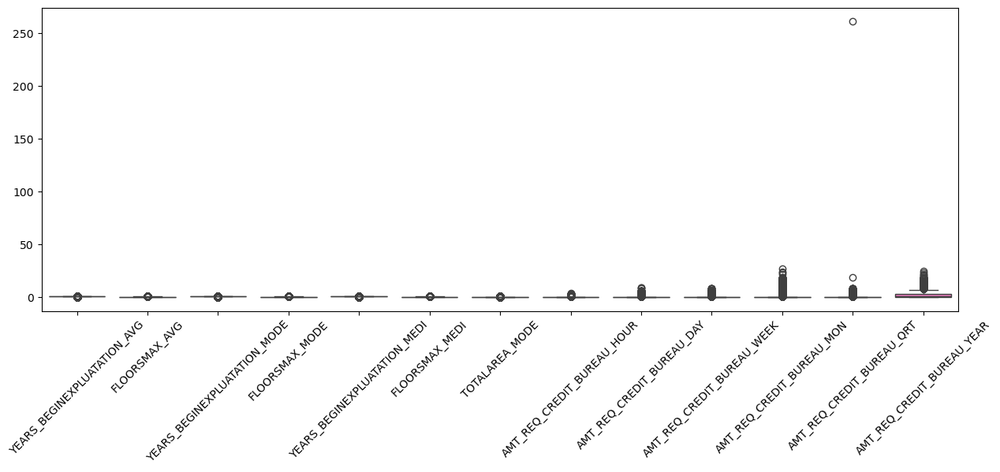

In [40]:
plt.figure(figsize=(15,5))
sns.boxplot(app[['YEARS_BEGINEXPLUATATION_AVG','FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR']])
plt.xticks(rotation=45)
plt.show()

In [41]:
impute=SimpleImputer(strategy='median')
app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR']]=impute.fit_transform(app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR']])

In [42]:
app.select_dtypes(float).isna().sum() # checking all nan values has filled by median 

AMT_INCOME_TOTAL                0
AMT_CREDIT                      0
AMT_ANNUITY                     0
AMT_GOODS_PRICE                 0
REGION_POPULATION_RELATIVE      0
DAYS_REGISTRATION               0
CNT_FAM_MEMBERS                 0
EXT_SOURCE_2                    0
EXT_SOURCE_3                    0
YEARS_BEGINEXPLUATATION_AVG     0
FLOORSMAX_AVG                   0
YEARS_BEGINEXPLUATATION_MODE    0
FLOORSMAX_MODE                  0
YEARS_BEGINEXPLUATATION_MEDI    0
FLOORSMAX_MEDI                  0
TOTALAREA_MODE                  0
OBS_30_CNT_SOCIAL_CIRCLE        0
DEF_30_CNT_SOCIAL_CIRCLE        0
OBS_60_CNT_SOCIAL_CIRCLE        0
DEF_60_CNT_SOCIAL_CIRCLE        0
DAYS_LAST_PHONE_CHANGE          0
AMT_REQ_CREDIT_BUREAU_HOUR      0
AMT_REQ_CREDIT_BUREAU_DAY       0
AMT_REQ_CREDIT_BUREAU_WEEK      0
AMT_REQ_CREDIT_BUREAU_MON       0
AMT_REQ_CREDIT_BUREAU_QRT       0
AMT_REQ_CREDIT_BUREAU_YEAR      0
dtype: int64

# Checking null values in dataset
 ###  0% null values in data 

In [45]:
app.isna().sum().sum()/app.shape[0] # checking null 

0.0

#### droping duplicates if any

In [47]:
app=app.drop_duplicates()

In [48]:
app

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


# - Handling outliers

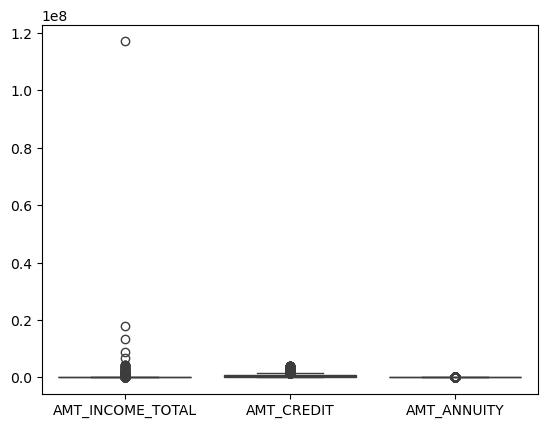

In [50]:
sns.boxplot(app[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY']])
plt.show()

##### Handling outliers in columns ...('AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY')
- check Lower bound ,upper bound
- I will Potting the numerial data based on the index and analysing if there are outliers in any of the column.
- I will also plot the Box plot of numerical data so to check the outliers and Range of each column.
- There are many outliers in  int and float columns so i assume that data does't have any error

In [52]:
q1=app[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY']].quantile(0.25) 
q3=app[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY']].quantile(0.75)
iqr = q3-q1
lb=q1-1.5*iqr
ub=q3+1.5*iqr


In [53]:
lb['AMT_INCOME_TOTAL'] # lower bound is -22500

-22500.0

In [54]:
ub['AMT_INCOME_TOTAL'] # upper bound is 337500

337500.0

In [55]:
lb['AMT_CREDIT']

-537975.0

In [56]:
ub['AMT_CREDIT']

1616625.0

In [57]:
lb['AMT_ANNUITY']

-10584.0

In [58]:
ub['AMT_ANNUITY']

61704.0

In [59]:
col=app.select_dtypes([int,float]).columns


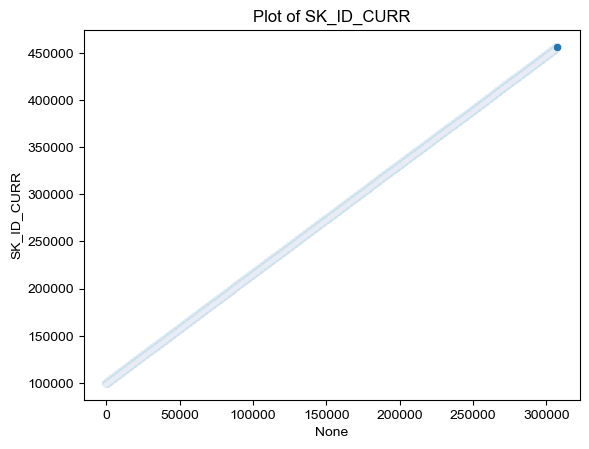

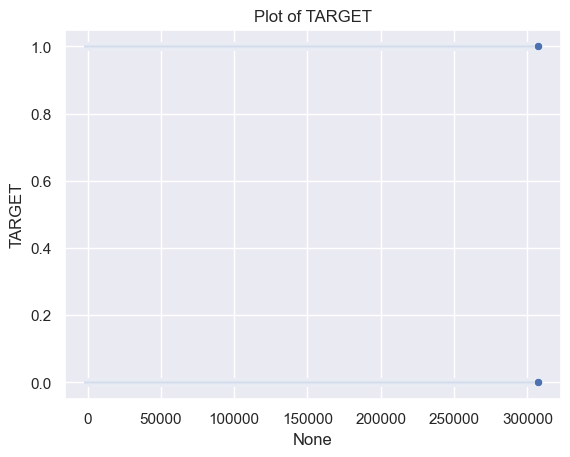

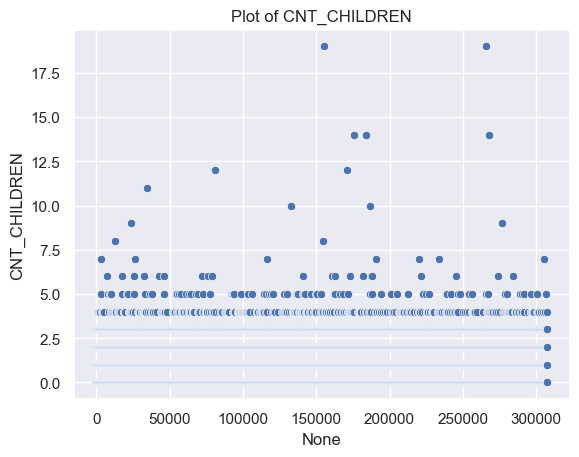

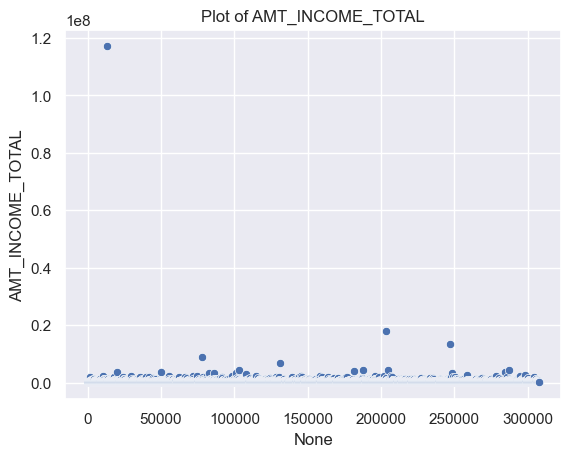

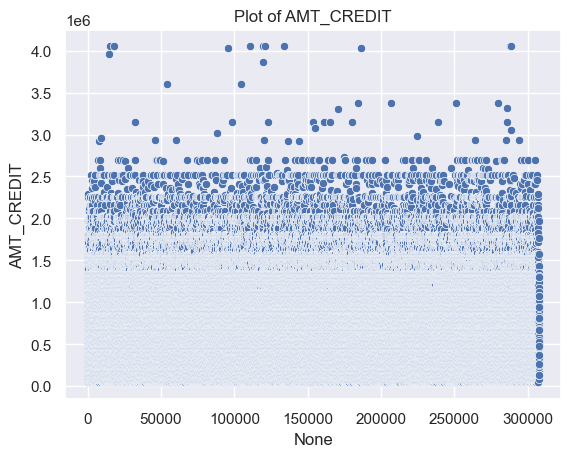

...

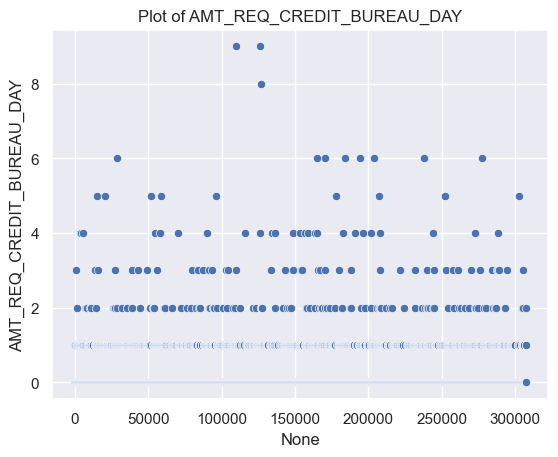

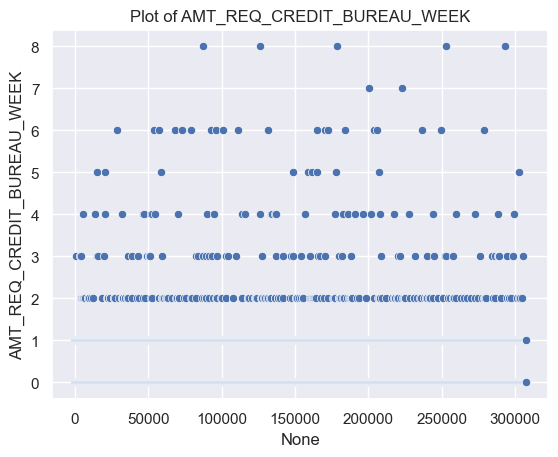

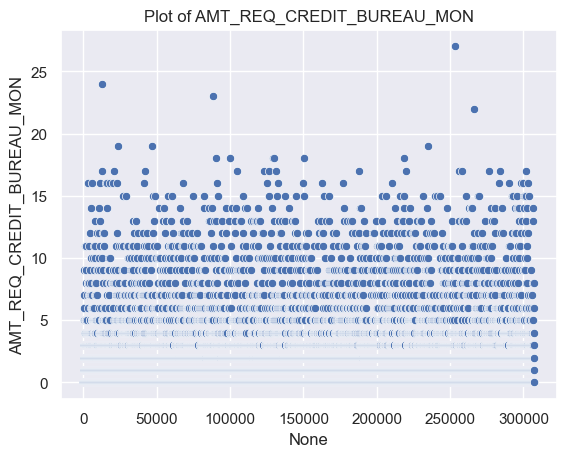

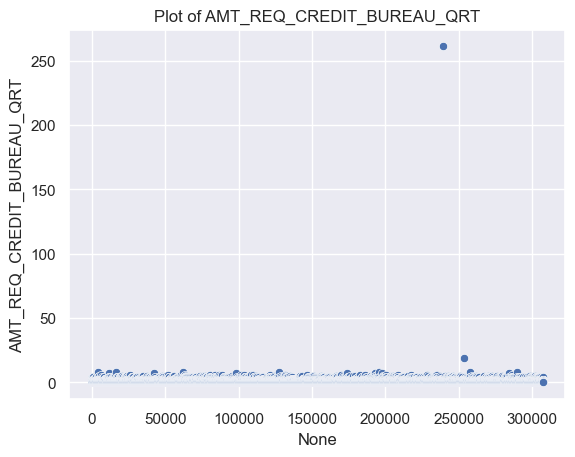

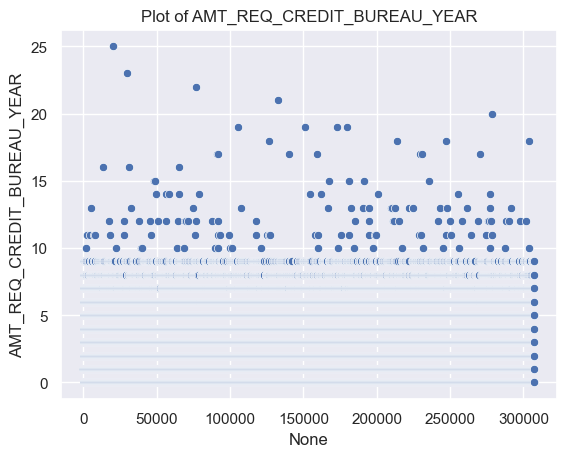

In [62]:
for i in col: # scatter plot
    plt.title('Plot of '+ i)
    sns.set(style='darkgrid')
    sns.scatterplot(x=app.index,y=app[i],data=app)
    plt.show()
    
    

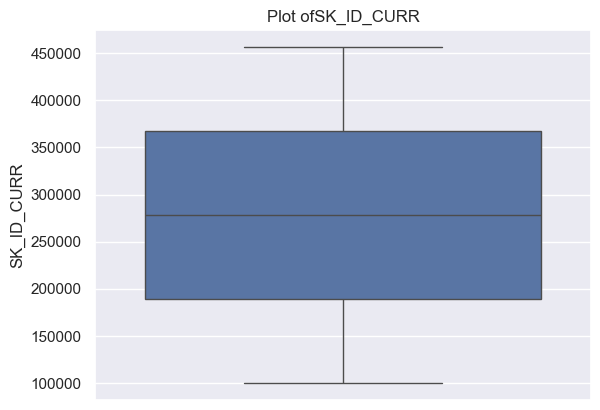

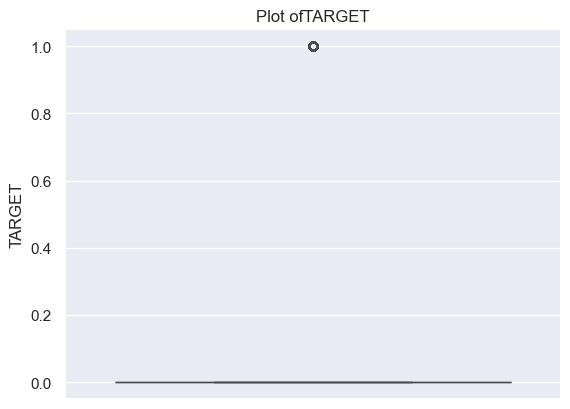

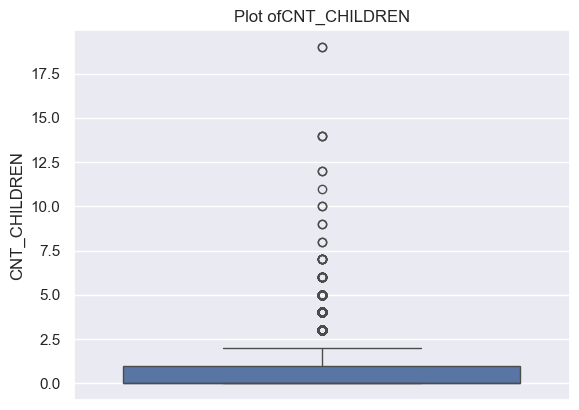

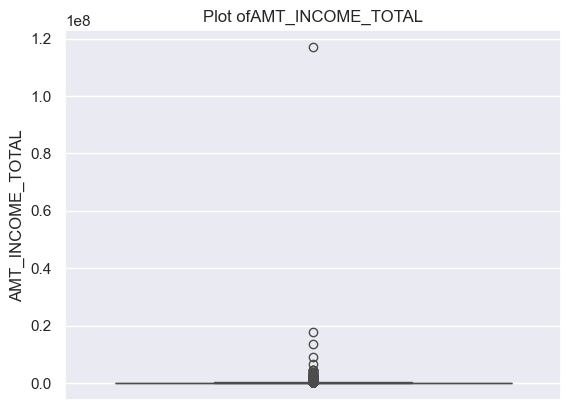

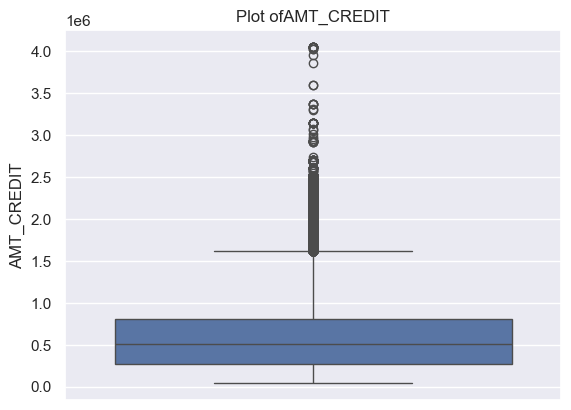

...

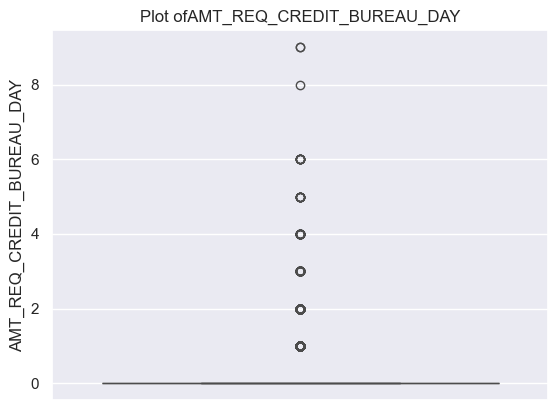

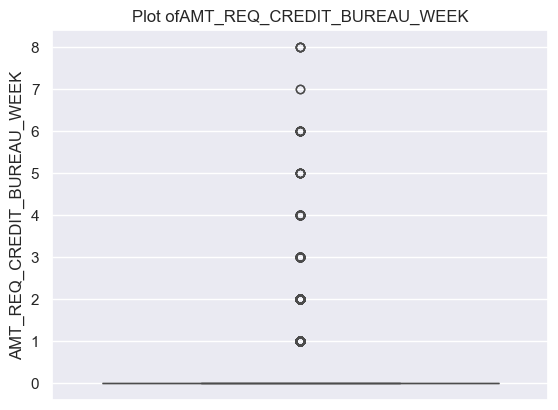

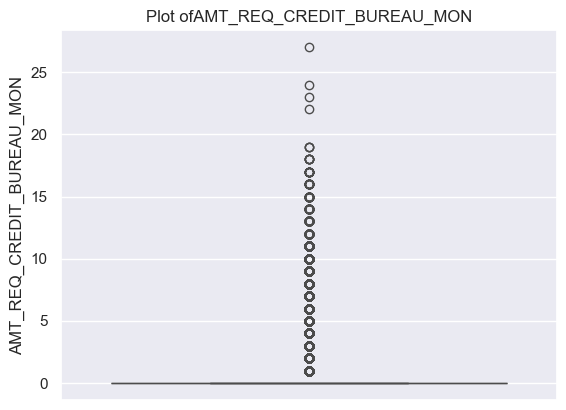

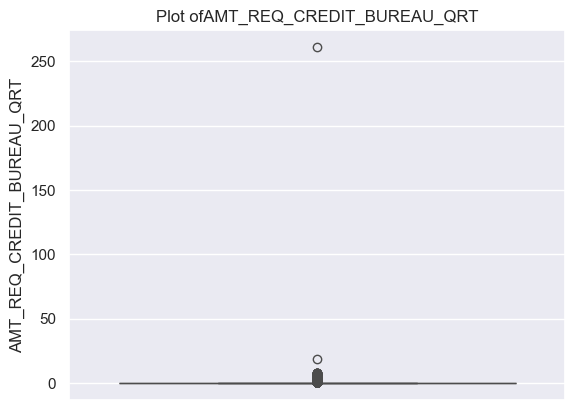

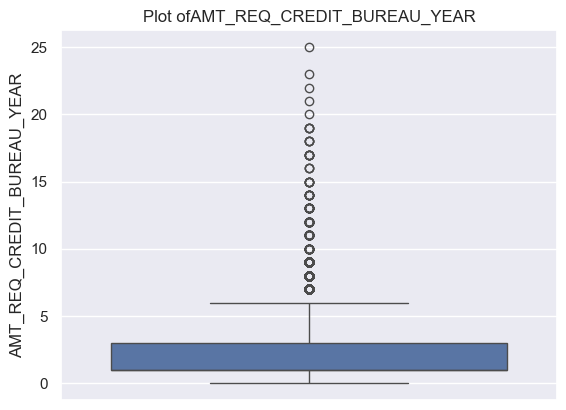

In [63]:
for i in col: # box plot
    plt.title("Plot of" + i)
    sns.boxplot(app[i])
    plt.show()

# 4. Exploratory Data Analysis (EDA)¶:
* Univarite analysis
* Bivariate analysis
* multivariate analysis

# * Univariate analysis
##### Categotical columns (object dtypes) analysis " Nominal"
- 1 pie chart ( too check the percentage of value in each columns )
- 2 Count plot (too check the count of value in columns )


In [66]:
col=app.select_dtypes('object').columns
col

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE'],
      dtype='object')

In [67]:
app['NAME_TYPE_SUITE'].value_counts(normalize=True)*100,app['NAME_INCOME_TYPE'].value_counts(normalize=True)*100,app['ORGANIZATION_TYPE'].value_counts(normalize=True)*100

(NAME_TYPE_SUITE
 Unaccompanied      81.238720
 Family             13.056118
 Spouse, partner     3.697429
 Children            1.062401
 Other_B             0.575589
 Other_A             0.281616
 Group of people     0.088127
 Name: proportion, dtype: float64,
 NAME_INCOME_TYPE
 Working                 51.631974
 Commercial associate    23.289248
 Pensioner               18.003258
 State servant            7.057634
 Unemployed               0.007154
 Student                  0.005853
 Businessman              0.003252
 Maternity leave          0.001626
 Name: proportion, dtype: float64,
 ORGANIZATION_TYPE
 Business Entity Type 3    22.110429
 XNA                       18.007161
 Self-employed             12.491260
 Other                      5.425172
 Medicine                   3.639870
 Business Entity Type 2     3.431747
 Government                 3.383294
 School                     2.891929
 Trade: type 7              2.546576
 Kindergarten               2.237318
 Construction   

# Analysis of Categorical Columns
### The pie chart provide a visual representation of the proportions of different categories within each categorical column. Here's an overview of the key findings:

###  NAME_CONTRACT_TYPE:

#### The vast majority of the data (90.5%) is related to cash loans, with the remaining 9.5% representing revolving loans. This suggests that cash loans are the predominant contract type in the dataset.
### CODE_GENDER:

#### The gender distribution shows that 66% of individuals are female, while 34% are male. This indicates a higher proportion of females in the dataset.
### FLAG_OWN_CAR:

#### Only 34% of individuals in the dataset own a car, whereas the majority (66%) do not own a car. This suggests that car ownership is not as common among the individuals represented in this dataset.
### FLAG_OWN_REALTY:

#### A significant proportion, 69%, own realty, while only 30.6% do not. This indicates that real estate ownership is relatively more common in the population under study.
### NAME_TYPE_SUITE:

#### A large majority, 81%, are categorized as unaccompanied, meaning they are not part of a larger group, while 13% are with family. The remaining 6% fall into other categories, such as friends or colleagues.
### NAME_INCOME_TYPE:

#### The most common income type is working, which accounts for 51% of the dataset. Other categories, including businessman, unemployed, student, and maternity, are significantly less common, each representing a very small fraction of the total.
### NAME_EDUCATION_TYPE:

#### The majority, 71%, of individuals have secondary or secondary special education, making it the highest educational attainment category. The second largest group has higher education, with other educational levels each accounting for less than 4%.
### NAME_FAMILY_STATUS:

#### 64% of individuals are married, indicating that most individuals in the dataset belong to the married category. Other family statuses make up the remaining 36%.
### OCCUPATION_TYPE:

#### The largest occupation group is laborers, accounting for 49% of the dataset. The second largest occupation group is sales staff, representing 10% of the data, with other occupation types making up the rest.


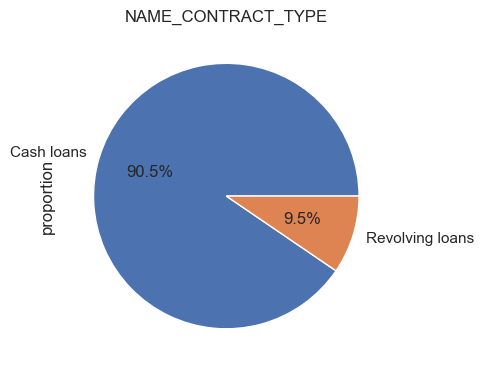

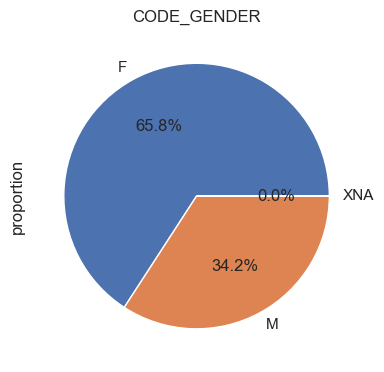

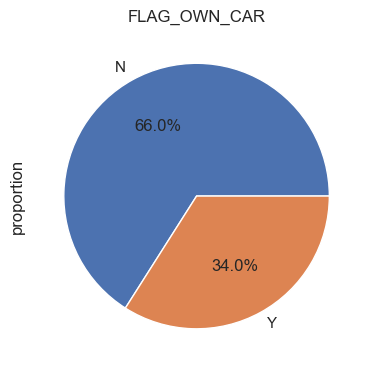

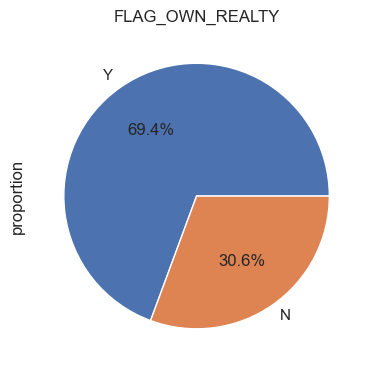

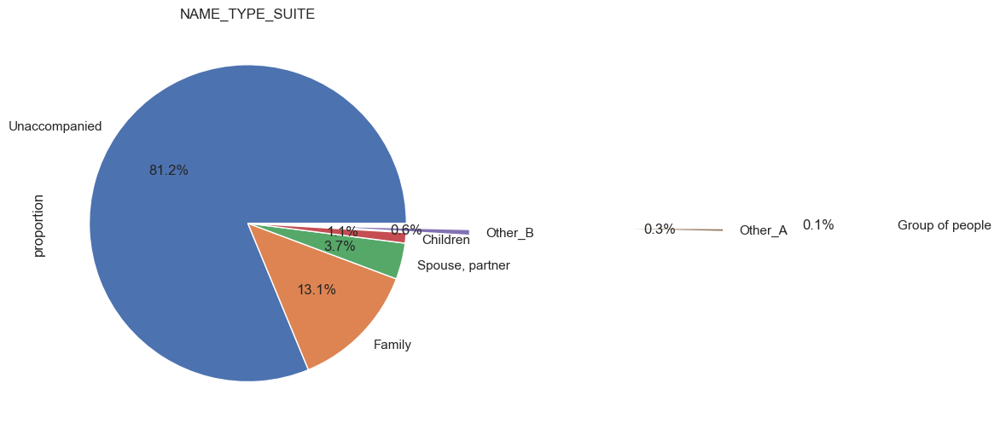

...

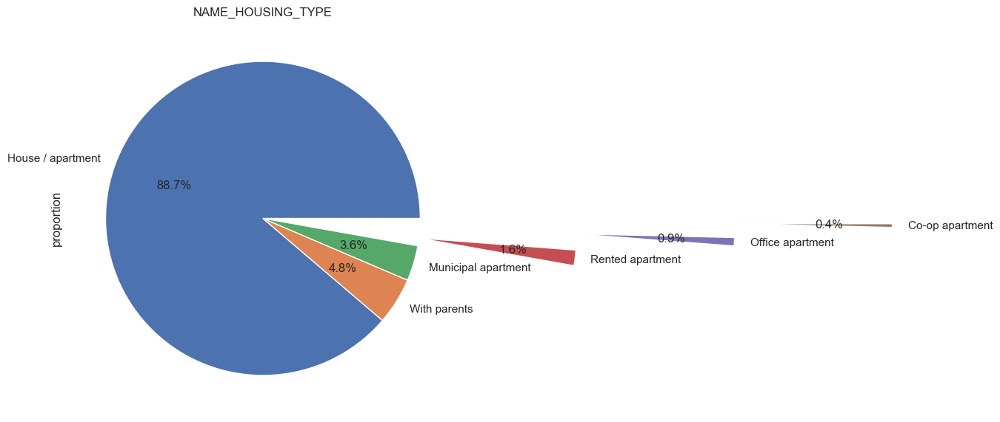

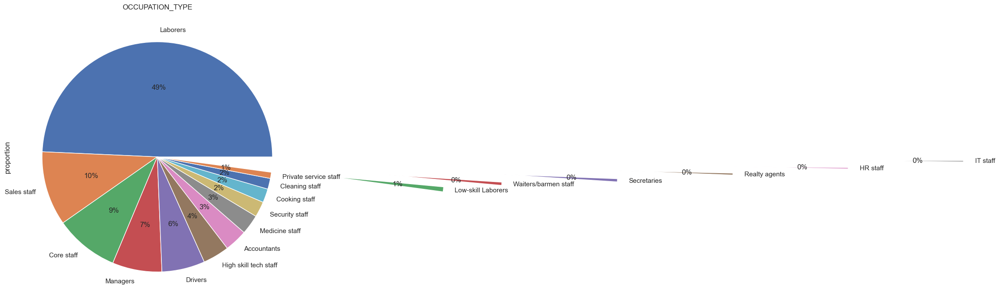

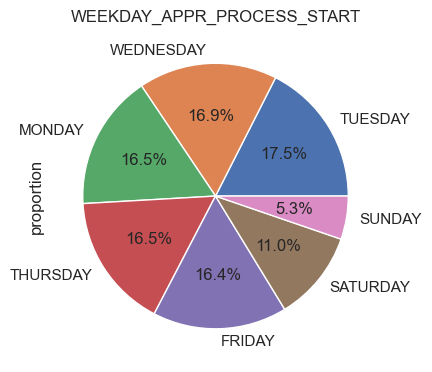

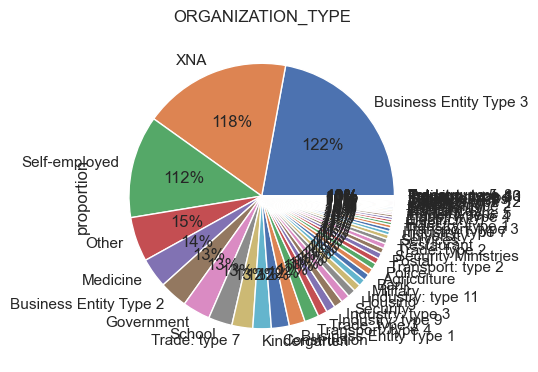

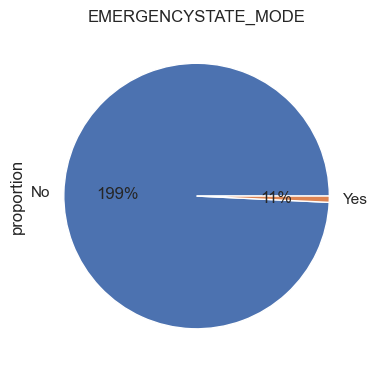

In [69]:
plt.figure(figsize=(25,25))
plt.subplot(5,3,1)
app['NAME_CONTRACT_TYPE'].value_counts(normalize=True).plot.pie(autopct='%.1f%%')
plt.title('NAME_CONTRACT_TYPE')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,2)
app['CODE_GENDER'].value_counts(normalize=True).plot.pie(autopct='%.1f%%')
plt.title('CODE_GENDER')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,3)
app['FLAG_OWN_CAR'].value_counts(normalize=True).plot.pie(autopct='%.1f%%')
plt.title('FLAG_OWN_CAR')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,4)
app['FLAG_OWN_REALTY'].value_counts(normalize=True).plot.pie(autopct='%.1f%%')
plt.title('FLAG_OWN_REALTY')
plt.show()

plt.figure(figsize=(25,35))
plt.subplot(5,3,5)
app['NAME_TYPE_SUITE'].value_counts(normalize=True).plot.pie(autopct='%.1f%%',explode=[0,0,0,0,0.4,2,3])
plt.title('NAME_TYPE_SUITE')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,6)
app['NAME_INCOME_TYPE'].value_counts(normalize=True).plot.pie(autopct='%.1f%%',explode=[0,0,0,0,1,2,0,3])
plt.title('NAME_INCOME_TYPE')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,7)
app['NAME_EDUCATION_TYPE'].value_counts(normalize=True).plot.pie(autopct='%.1f%%',explode=[0,0,0,1,2])
plt.title('NAME_EDUCATION_TYPE')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,8)
app['NAME_FAMILY_STATUS'].value_counts(normalize=True).plot.pie(autopct='%.1f%%')
plt.title('NAME_FAMILY_STATUS')
plt.show()


plt.figure(figsize=(25,40))
plt.subplot(5,3,9)
app['NAME_HOUSING_TYPE'].value_counts(normalize=True).plot.pie(autopct='%.1f%%',explode=[0,0,0,1,2,3])
plt.title('NAME_HOUSING_TYPE')
plt.show()

plt.figure(figsize=(30,50))
plt.subplot(5,3,10)
app['OCCUPATION_TYPE'].value_counts(normalize=True).plot.pie(autopct='%.f%%',explode=[0,0,0,0,0,0,0,0,0,0,0,0,1.5,2,3,4,5,6])
plt.title('OCCUPATION_TYPE')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,11)
app['WEEKDAY_APPR_PROCESS_START'].value_counts(normalize=True).plot.pie(autopct='%.1f%%')
plt.title('WEEKDAY_APPR_PROCESS_START')
plt.show()

plt.figure(figsize=(20,25))
plt.subplot(5,3,12)
app['ORGANIZATION_TYPE'].value_counts(normalize=True).plot.pie(autopct='1%.f%%')
plt.title('ORGANIZATION_TYPE')
plt.show()

plt.figure(figsize=(25,25))
plt.subplot(5,3,13)
app['EMERGENCYSTATE_MODE'].value_counts(normalize=True).plot.pie(autopct='1%.f%%')
plt.title('EMERGENCYSTATE_MODE')
plt.show()


In [71]:
col=app.select_dtypes('object').columns
col

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE'],
      dtype='object')

### Analysis of Categorical Columns (Count Plots)
#### The count plots provide a visual representation of the actual number of occurrences for each category within the categorical columns. Below is a summary based on the count plot observations:

### NAME_CONTRACT_TYPE:

#### The count plot shows a much higher count of cash loans compared to revolving loans. The data confirms that cash loans are the predominant contract type, with a clear majority of instances compared to the fewer revolving loans.
### CODE_GENDER:

#### In the count plot, the female category is represented by a significantly larger count than the male category, showing that females are more frequent in the dataset. You can observe the actual number of females is about twice as many as males, aligning with the 66%-34% proportion mentioned earlier.
### FLAG_OWN_CAR:

#### The count plot illustrates that the number of individuals who do not own a car is significantly higher than those who own a car. You can easily see the count for individuals without a car far outweighs those with one.
### FLAG_OWN_REALTY:

#### The count for individuals who own realty is substantially higher than those who do not. The count plot shows that there are more individuals with realty ownership, reinforcing the higher frequency of realty ownership in the dataset.
### NAME_TYPE_SUITE:

#### The unaccompanied category is much more frequent in the count plot, showing a very high number of individuals in this category compared to the family group, which appears far less frequently. The count of unaccompanied individuals is overwhelming compared to other suite types.
### NAME_INCOME_TYPE:

#### The count plot shows a large number of individuals with the working income type, with the rest of the categories like businessman, unemployed, student, and maternity having a much smaller count. The working category has a noticeably higher count than all other income types combined.
### NAME_EDUCATION_TYPE:

#### The secondary/secondary special education category has the highest count, and you can see in the count plot that this category has a significantly larger number of individuals than the higher education category. Other education levels have relatively small counts.
### NAME_FAMILY_STATUS:

#### The married category shows the highest count, with married individuals being the largest group in the dataset. The count for individuals in other family statuses is lower, confirming that the married group is the most common.
### OCCUPATION_TYPE:

####  The laborers group has the highest count in the occupation type category, with the count for laborers much higher than the sales staff group, which is the second-largest. Other occupation types have lower counts.


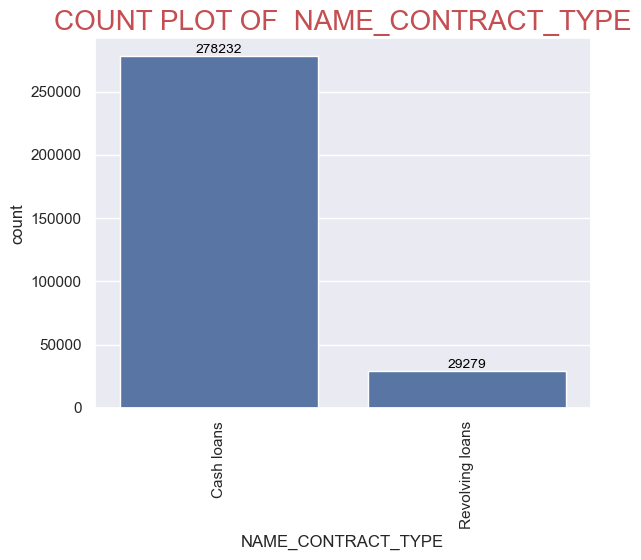

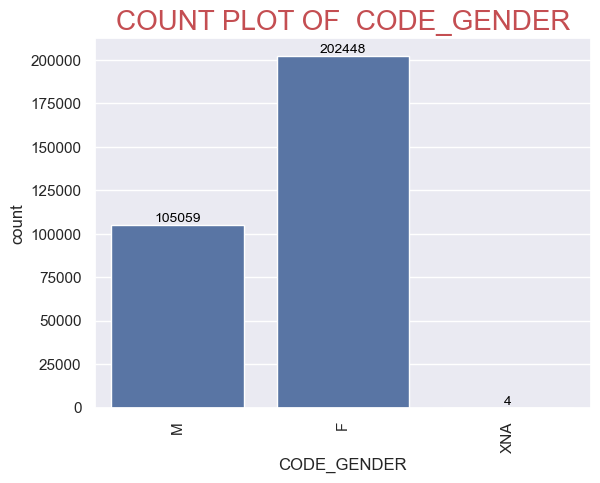

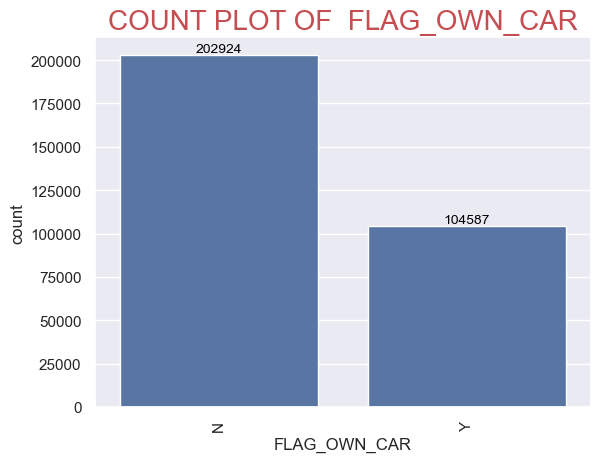

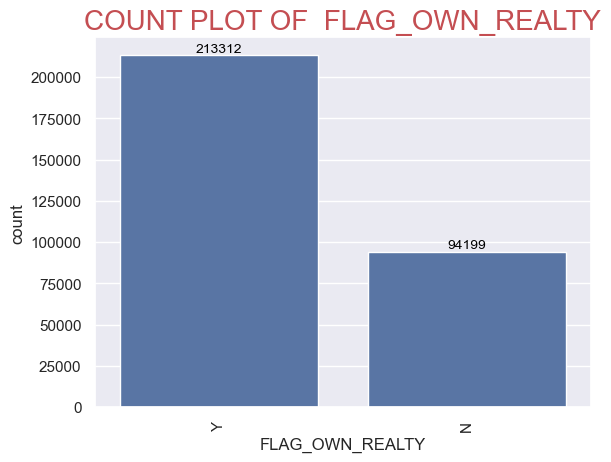

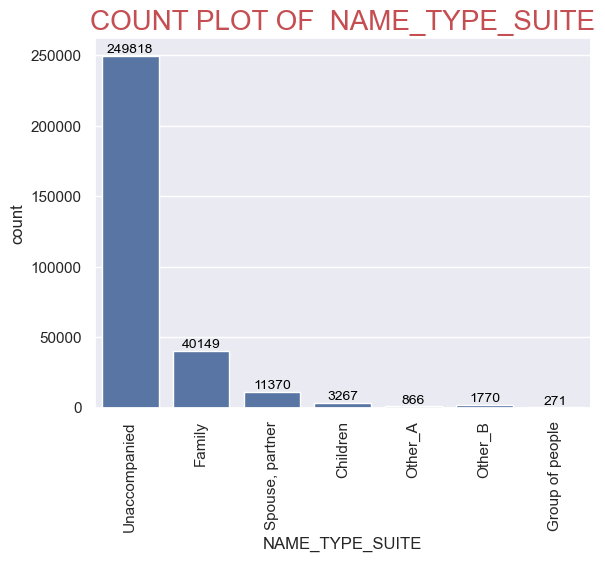

...

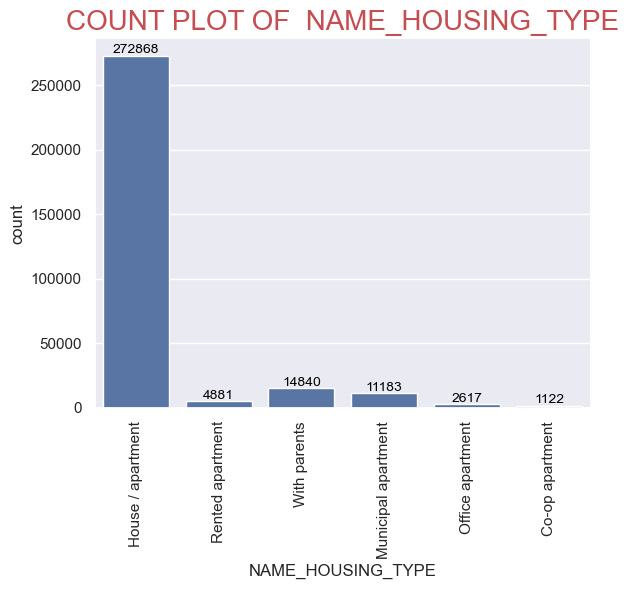

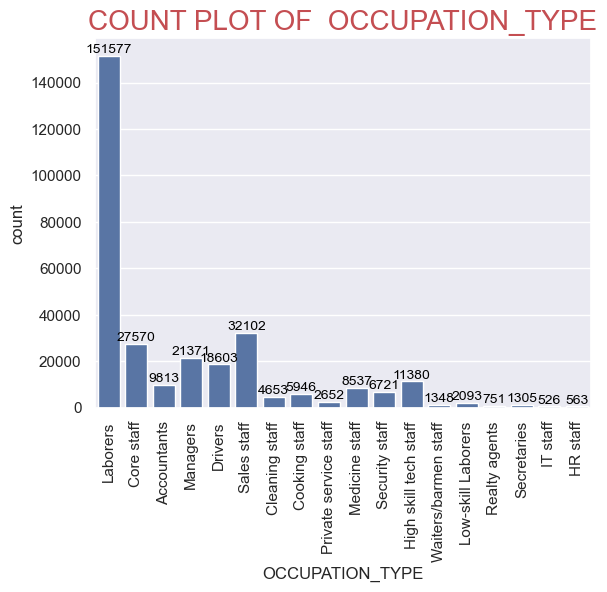

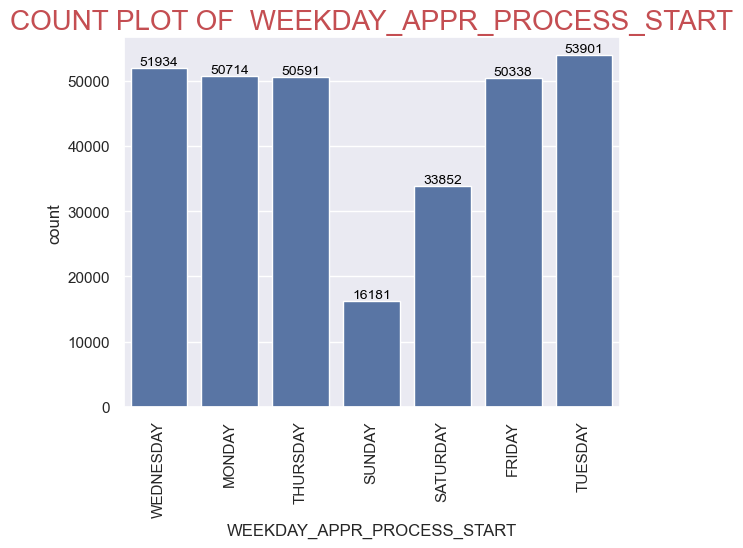

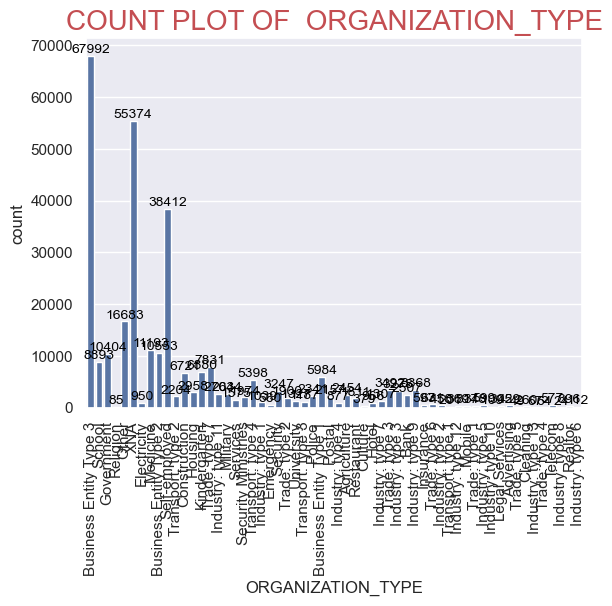

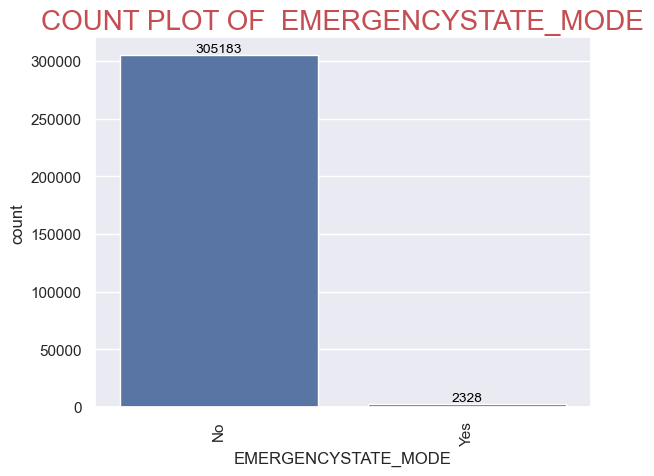

In [73]:
for i in col:
    plt.title('COUNT PLOT OF '+" "+ i,color='r',fontsize=20)
    x=sns.countplot(x=app[i],data=app)
    x.bar_label(x.containers[0],fontsize=10,color='black')
    plt.xticks(rotation=90)
    plt.show()
    

In [74]:
app.select_dtypes(int).nunique().head(60) # most of the columns are binary categorical columns 

SK_ID_CURR                     307511
TARGET                              2
CNT_CHILDREN                       15
DAYS_BIRTH                      17460
DAYS_EMPLOYED                   12574
DAYS_ID_PUBLISH                  6168
FLAG_MOBIL                          2
FLAG_EMP_PHONE                      2
FLAG_WORK_PHONE                     2
FLAG_CONT_MOBILE                    2
FLAG_PHONE                          2
FLAG_EMAIL                          2
REGION_RATING_CLIENT                3
REGION_RATING_CLIENT_W_CITY         3
HOUR_APPR_PROCESS_START            24
REG_REGION_NOT_LIVE_REGION          2
REG_REGION_NOT_WORK_REGION          2
LIVE_REGION_NOT_WORK_REGION         2
REG_CITY_NOT_LIVE_CITY              2
REG_CITY_NOT_WORK_CITY              2
LIVE_CITY_NOT_WORK_CITY             2
FLAG_DOCUMENT_2                     2
FLAG_DOCUMENT_3                     2
FLAG_DOCUMENT_4                     2
FLAG_DOCUMENT_5                     2
FLAG_DOCUMENT_6                     2
FLAG_DOCUMEN

# Numerical columns anlysis (dtypes int and float):

# Analysis of int Columns

In [77]:
app.select_dtypes(int).columns # to check and remove binary columns 

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2',
       'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
       'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11',
       'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21'],
      dtype='object')

- Columns that contain only 0 and 1 values are typically referred to as binary variables or binary flags.

In [79]:
# Binary categorical columns and convert into category dtype and store into Categorical_columns varables

Categorical_columns=app[['TARGET',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2',
       'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
       'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
       'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11',
       'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
       'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21']].astype('category')

In [80]:
Categorical_columns

,TARGET,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
0,1,1,1,0,1,1,0,2,2,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,1,0,1,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,1,1,1,1,0,2,2,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,0,1,0,0,2,2,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,1,0,1,0,0,2,2,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,1,1,0,1,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
307507,0,1,0,0,1,1,0,2,2,0,...,0,0,0,0,0,0,0,0,0,0
307508,0,1,1,0,1,0,1,3,3,0,...,0,0,0,0,0,0,0,0,0,0
307509,1,1,1,0,1,0,0,2,2,0,...,0,0,0,0,0,0,0,0,0,0


# Analysis of Binary Columns
### TARGET:

#### The TARGET column shows a higher frequency of 0s compared to 1s, meaning that the majority of records are classified under the "0" category, which represents high. The "1" category, which represents low, occurs less frequently.
### FLAG_MOBIL:

#### In the FLAG_MOBIL column, the 1s are predominant, indicating that most individuals in the dataset have a mobile phone. The number of 0s, representing the absence of a mobile phone, is much lower.
### FLAG_EMP_PHONE:

#### The FLAG_EMP_PHONE column shows a high number of 1s, which indicates that the majority of individuals in the dataset have an employee phone. 0s are less frequent, suggesting that a smaller portion of the dataset does not have an employee phone.
### FLAG_PHONE:

#### The FLAG_PHONE column displays a higher count of 0s, indicating that most individuals do not have a phone. The 1s, showing those who have a phone, are much fewer.
### FLAG_EMAIL:

#### Similarly, in the FLAG_EMAIL column, 0s dominate, indicating that most individuals do not have an email. The 1s, showing those who have an email, are relatively few.
### LIVE_REGION_NOT_WORK_REGION:

#### In this column, 0s are more common, meaning that most individuals live in the same region they work in. The 1s, representing those who live in a different region from their work region, are much less frequent.
### FLAG_DOCUMENT_2:

#### The FLAG_DOCUMENT_2 column has a higher count of 0s, indicating that most individuals do not have the document represented by FLAG_DOCUMENT_2. The 1s are less common, suggesting that fewer individuals have this document.
### FLAG_DOCUMENT_3:

#### The FLAG_DOCUMENT_3 column also shows that 0s are the majority, suggesting that most individuals do not possess the document represented by FLAG_DOCUMENT_3. The 1s are less frequent, indicating that fewer individuals hold this document.


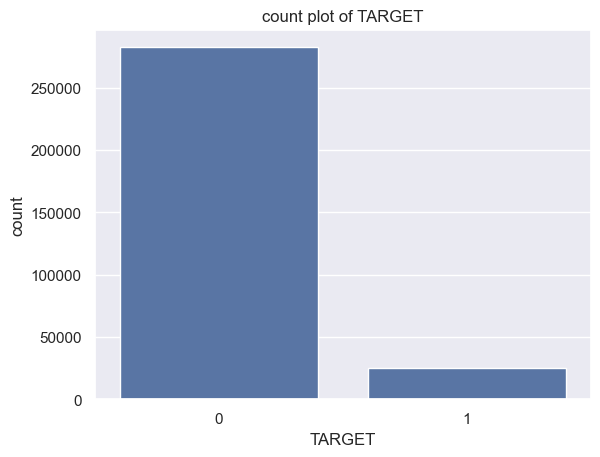

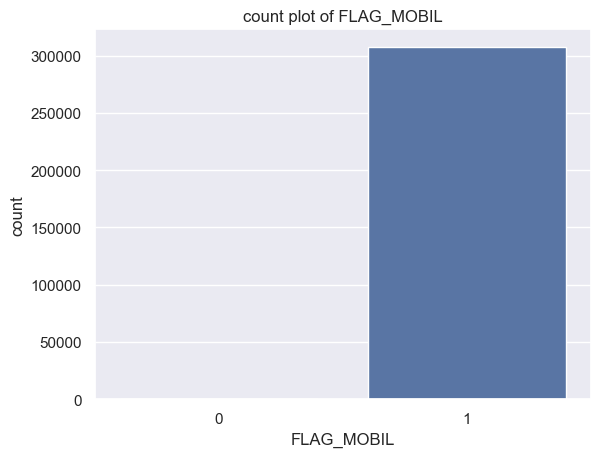

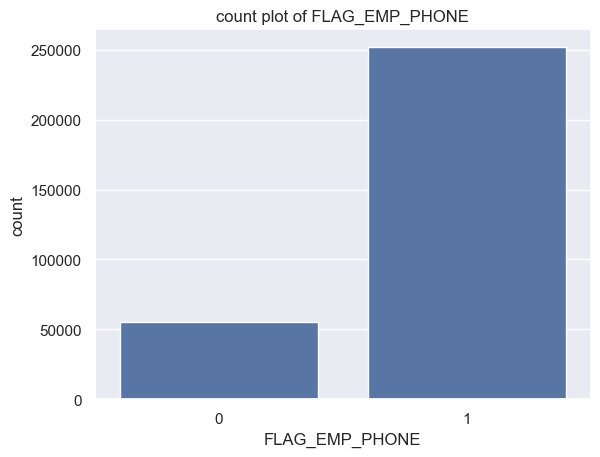

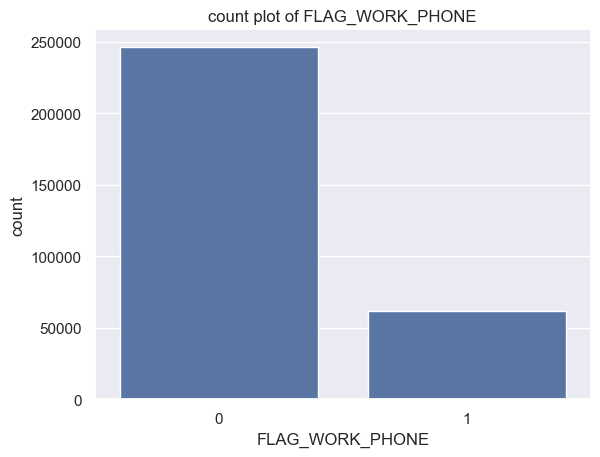

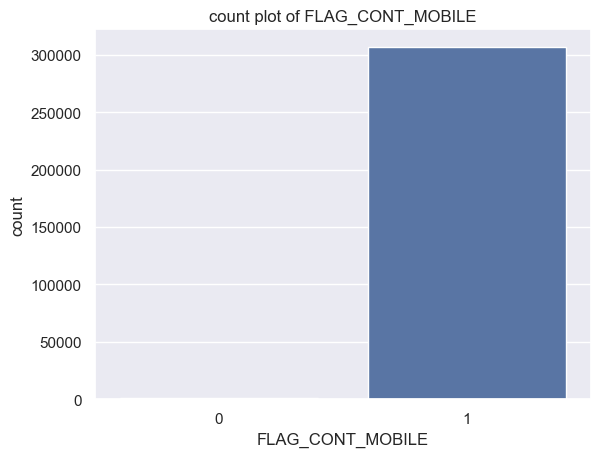

...

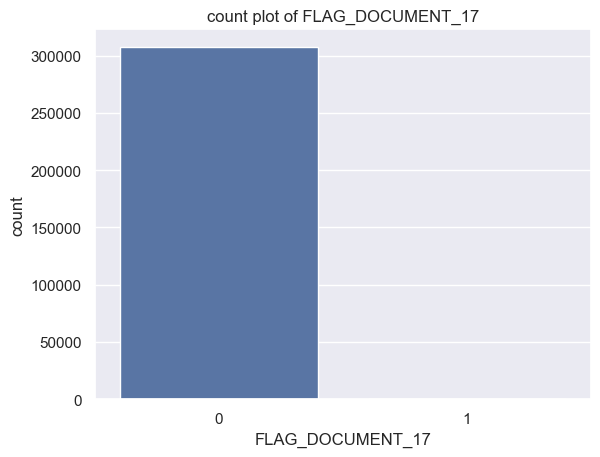

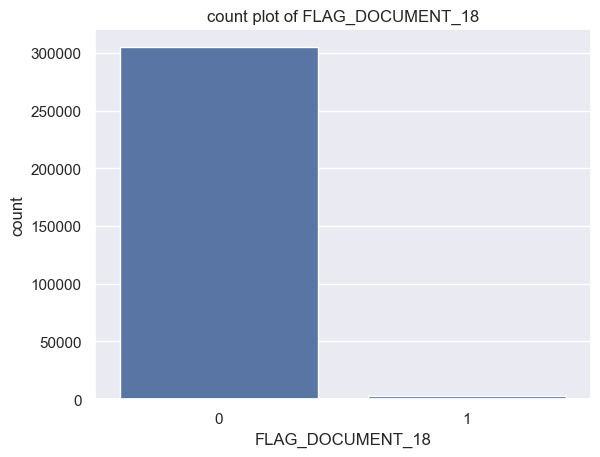

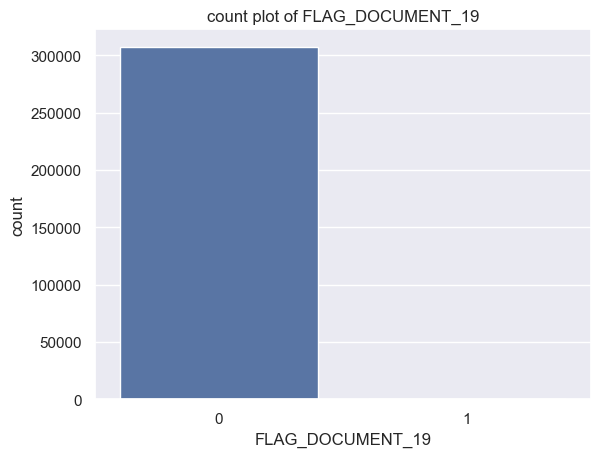

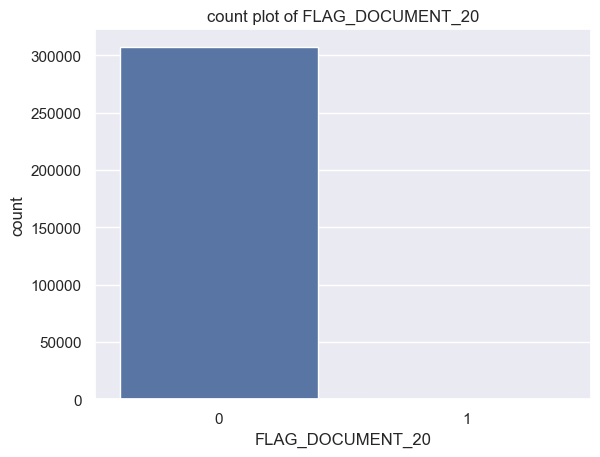

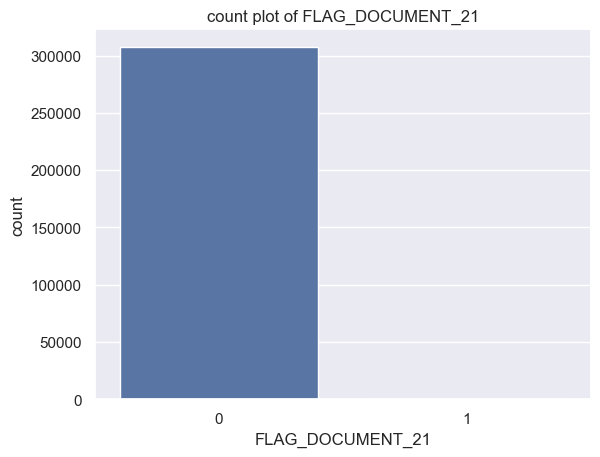

In [82]:
for i in Categorical_columns: # ploting count plot of all Binary columns  
    plt.title('count plot of'+' '+ i)
    sns.countplot(x=app[i],data=app)
    plt.show()

- Numerical columns int type DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,CNT_CHILDREN,HOUR_APPR_PROCESS_START
   - Histogram plot for DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH to see the distribution.
   - Count plot for CNT_CHILDREN,HOUR_APPR_PROCESS_START 


In [84]:
# converting the DAYS_BIRTH column from days into year  
app['DAYS_BIRTH']=app['DAYS_BIRTH']/-365
app['DAYS_BIRTH']=app['DAYS_BIRTH'].round(1)

### Analysis of 'DAYS_BIRTH' (Age)
#### The DAYS_BIRTH column represents the age of individuals in the dataset, calculated in days. The distribution of ages in the dataset shows the following key points:

#### The average age of individuals falls between 40 and 50 years.
#### The data exhibits a left skew (negatively skewed), meaning the tail of the distribution is longer on the left side.
#### In terms of central tendency:
#### The mean age is less than the median, and the median is less than the mode. This suggests that the majority of individuals are clustered in the middle range of ages, with fewer people in the younger and older age ranges.
#### This left skew implies that while most individuals in the dataset are in the 40-50 age range, there are also a smaller number of older individuals, which pulls the mean towards the lower end compared to the median.



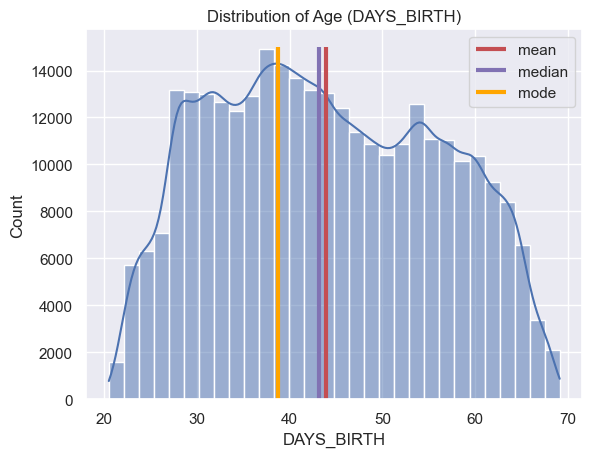

In [86]:
sns.histplot(x=app['DAYS_BIRTH'],data=app,kde=True,bins=30)
plt.title('Distribution of Age (DAYS_BIRTH)')
plt.vlines(app['DAYS_BIRTH'].mean(),ymin=0,ymax=15000,color='r',label='mean',linewidth=3)
plt.vlines(app['DAYS_BIRTH'].median(),ymin=0,ymax=15000,color='m',label='median',linewidth=3)
plt.vlines(app['DAYS_BIRTH'].mode(),ymin=0,ymax=15000,color='orange',label='mode',linewidth=3)
plt.legend()
plt.show()

In [87]:
# converting the DAYS_EMPLOYED column from days inti year 
app['DAYS_EMPLOYED']=app['DAYS_EMPLOYED']/-365
app['DAYS_EMPLOYED']=app['DAYS_EMPLOYED'].round(1)

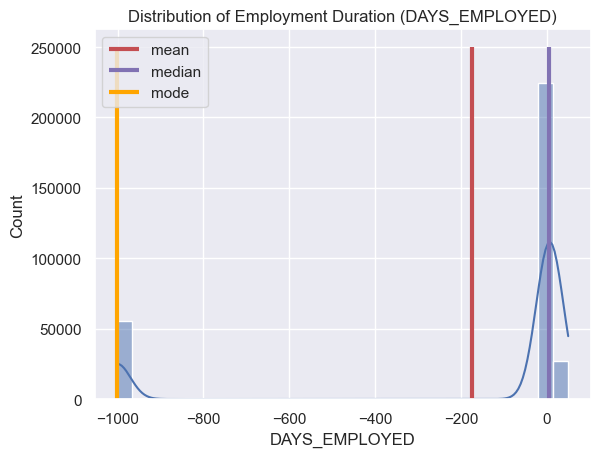

In [88]:
sns.histplot(x=app['DAYS_EMPLOYED'],data=app,kde=True,bins=30)
plt.title('Distribution of Employment Duration (DAYS_EMPLOYED)')
plt.vlines(app['DAYS_EMPLOYED'].mean(),ymin=0,ymax=250000,color='r',label='mean',linewidth=3)
plt.vlines(app['DAYS_EMPLOYED'].median(),ymin=0,ymax=250000,color='m',label='median',linewidth=3)
plt.vlines(app['DAYS_EMPLOYED'].mode(),ymin=0,ymax=250000,color='orange',label='mode',linewidth=3)
plt.legend()
plt.show()

In [89]:
# converting DAYS_ID_PUBLISH  column from days into year
app['DAYS_ID_PUBLISH']=app['DAYS_ID_PUBLISH']/-365
app['DAYS_ID_PUBLISH']=app['DAYS_ID_PUBLISH'].round(1)

## Analysis of 'DAYS_ID_PUBLISH' (Days Since ID Publication)
### The DAYS_ID_PUBLISH column represents the number of days since the identification document was published for each individual. The distribution of this data shows the following key points:

##### The distribution is right-skewed (positively skewed), meaning the tail of the distribution is longer on the right side.
##### In terms of central tendency:
##### The mean is greater than the median, and the median is greater than the mode. This indicates that most values are concentrated towards the lower end (indicating IDs that were published more recently), but there are some outliers with IDs that were published much earlier, which pull the mean to the right.
##### The highest frequency of values (the mode) falls within the range of 10 to 12.5 years ago, meaning most individuals have identification documents issued around this period.
##### This right skew suggests that while many individuals have relatively recent identification documents, there is a smaller number of individuals with documents issued a long time ago, creating the right tail in the distribution.



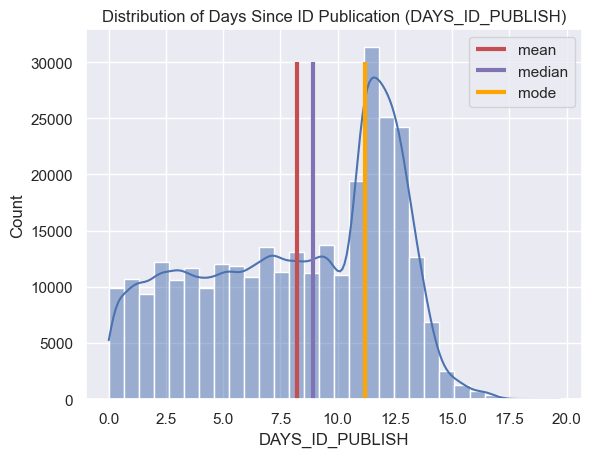

In [91]:
sns.histplot(x=app['DAYS_ID_PUBLISH'],data=app,kde=True,bins=30)
plt.title('Distribution of Days Since ID Publication (DAYS_ID_PUBLISH)')
plt.vlines(app['DAYS_ID_PUBLISH'].mean(),ymin=0,ymax=30000,color='r',label='mean',linewidth=3)
plt.vlines(app['DAYS_ID_PUBLISH'].median(),ymin=0,ymax=30000,color='m',label='median',linewidth=3)
plt.vlines(app['DAYS_ID_PUBLISH'].mode(),ymin=0,ymax=30000,color='orange',label='mode',linewidth=3)
plt.legend()
plt.show()

## Analysis of 'CNT_CHILDREN' (Number of Children)
#### The CNT_CHILDREN column represents the number of children each individual has. The distribution of this data shows the following key points:

##### The majority of individuals in the dataset have 0 children. This suggests that the dataset contains a large proportion of individuals without children.
##### There are fewer individuals with 1, 2, or more children, indicating that childless individuals make up the dominant group in this dataset.
##### This distribution indicates that, for the most part, the individuals represented in the dataset are either younger or simply do not have children at the time of data collection.                    

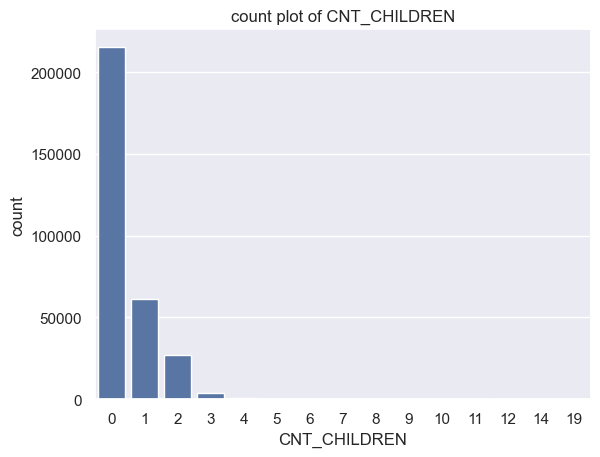

In [93]:
sns.countplot(x=app['CNT_CHILDREN'],data=app)
plt.title('count plot of CNT_CHILDREN')
plt.show()

## Analysis of 'HOUR_APPR_PROCESS_START' (Approval Process Start Hour)
### The HOUR_APPR_PROCESS_START column represents the hour of the day when the approval process started for each individual. The distribution of this data shows the following key points:

##### The data follows a relatively normal distribution with most approval processes occurring between 8 AM and 5 PM (hours 8 to 17).
##### This suggests that the approval processes are concentrated during regular business hours, which is typical for many business operations.
##### The peak of the distribution occurs around the mid-morning to late afternoon hours, reflecting standard working hours for most businesses.
##### There is a broader, more balanced distribution between hours 2 AM and 9 PM, but the frequency of approval process starts drops off outside of the 8 AM to 5 PM range.

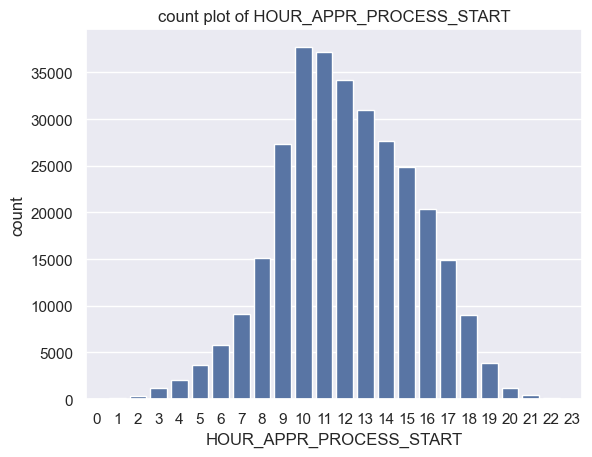

In [95]:
sns.countplot(x=app['HOUR_APPR_PROCESS_START'],data=app)
plt.title('count plot of HOUR_APPR_PROCESS_START')
plt.show()

# Analysis of Float Columns
## We analyzed the distribution of several continuous numerical variables (float columns) using histograms with Kernel Density Estimation (KDE) to understand the underlying patterns. The key observations from these distributions include:

#### The majority of the continuous variables exhibit diverse ranges and patterns. Some columns, such as AMT_INCOME_TOTAL, AMT_CREDIT, and AMT_GOODS_PRICE, show a wide spread with a tendency towards higher values, indicating skewness in the data.

#### Other variables, like DAYS_BIRTH (age) and DAYS_EMPLOYED (employment duration), contain negative values which are commonly used to represent time in days relative to a reference point (today). These columns have a more centralized distribution, with varying levels of skewness and centrality.

#### Many variables, such as EXT_SOURCE_2, EXT_SOURCE_3, and YEARS_BEGINEXPLUATATION_AVG, show distributions that may lean towards normality, with peaks around certain values, but still exhibit some degree of spread.

#### A few columns, such as *AMT_REQ_CREDIT_BUREAU_ (hour, day, week, month, etc.)**, indicate that the frequency of credit bureau requests is generally lower, with most values clustered around zero, suggesting infrequent use of these features.

#### Some columns related to family and social circle information (CNT_FAM_MEMBERS, OBS_30_CNT_SOCIAL_CIRCLE) show distributions that suggest more centralized family sizes and social circle interactions, though some outliers exist in the data.

#### Overall, the distributions reveal a mixture of skewed, normal, and uniform patterns across different features. These variations can provide insight into how individuals in the dataset behave, interact with the system, and their demographic characteristics.

In [97]:
col=app.select_dtypes(float).columns

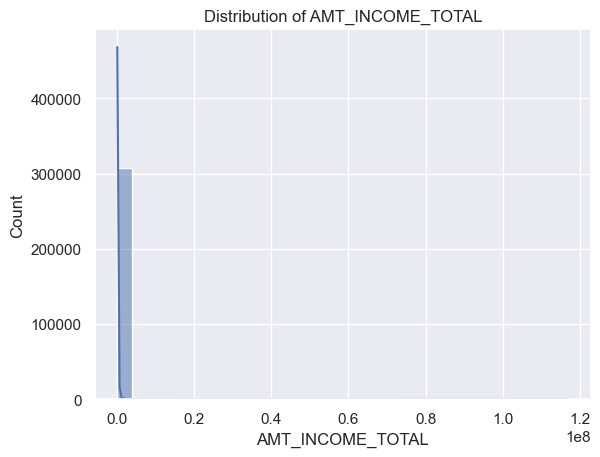

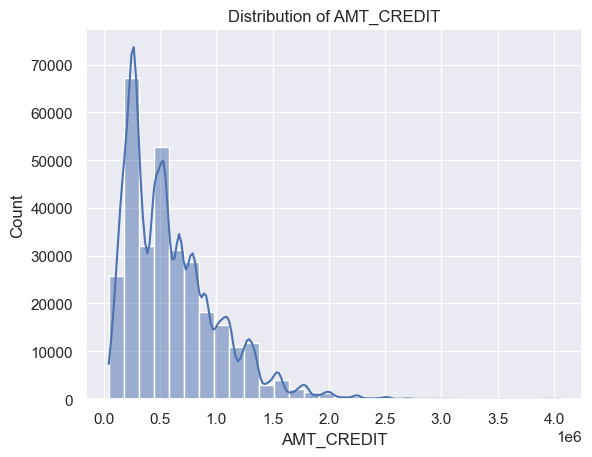

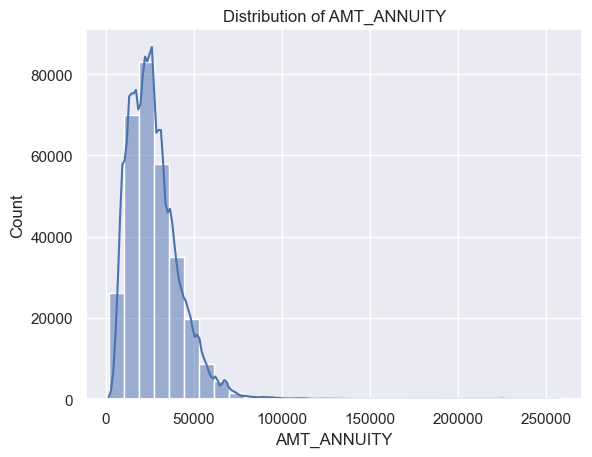

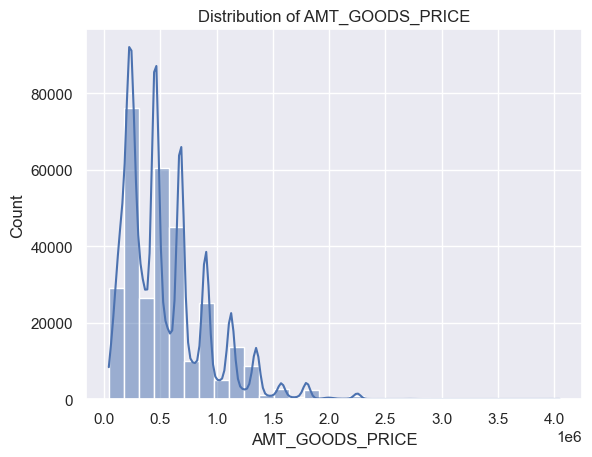

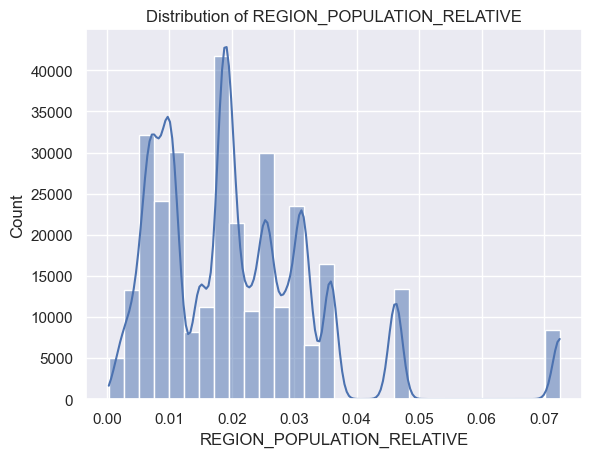

...

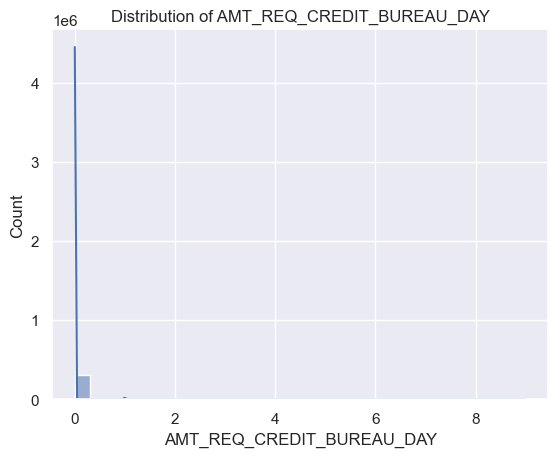

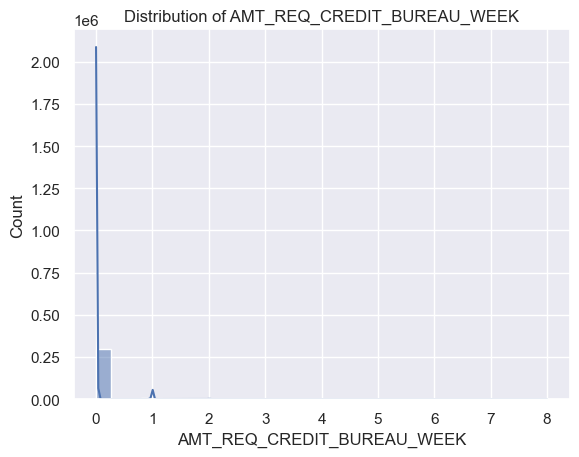

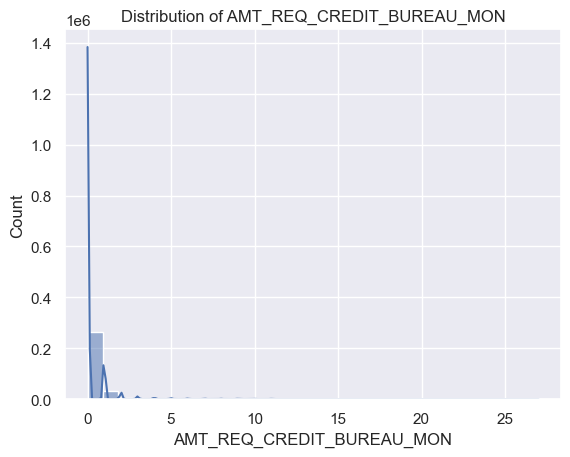

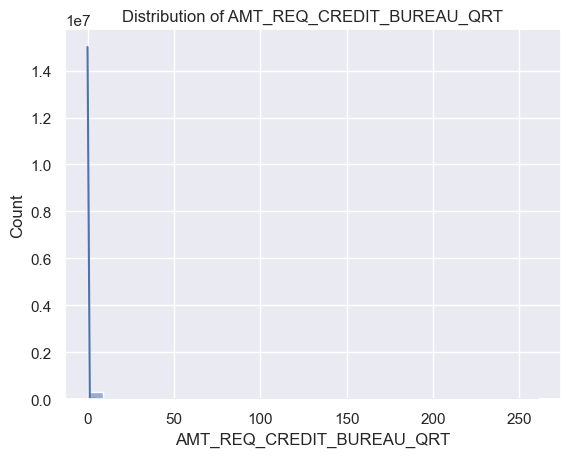

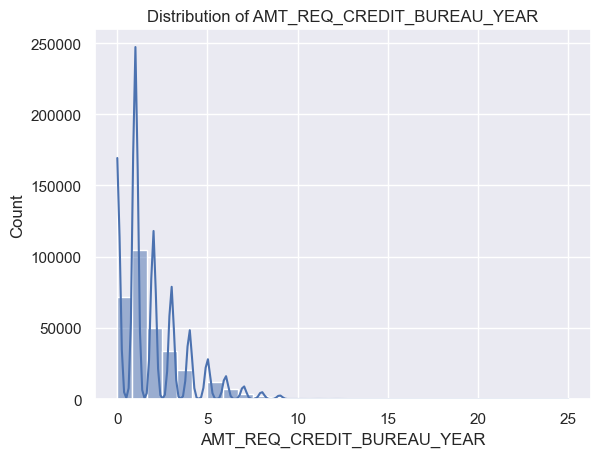

In [98]:
for i in col:
    plt.title('Distribution of' +' '+ i)
    sns.histplot(x=app[i],data=app,bins=30,kde=True)
    plt.show()

# * Bivariate analysis and Multivarient analysis


# 1 Categorical vs Categorical 
# 2 Numerical vs Categorical  
# 3 Numerical vs Numerical 


### 1 Categorical vs Categorical
    * CODE_GENDER VS OTHER CATEGORICAL COLUMNS
    * NAME_CONTRACT_TYPE VS OTHER CATEGORICAL COLUMNS
    * Using countplot with hue

In [103]:
num_cols = app.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = app.select_dtypes(include=['object']).columns.tolist()

## Bivariate Analysis of Categorical Variables with CODE_GENDER
### The following countplots show the distribution of different categorical variables across male and female customers. These insights help us understand gender-based trends in the dataset.
#### NAME_CONTRACT_TYPE vs CODE_GENDER
##### In Cash Loans, the number of female applicants is significantly higher than male applicants.
##### In Revolving Loans, females also dominate, but the difference is smaller compared to cash loans.
##### Insight: Women are more likely to take both types of loans than men.
#### FLAG_OWN_CAR vs CODE_GENDER
##### Among those who don’t own a car (N), females are in the majority.
##### Among those who own a car (Y), males are more than females.
##### Insight: Men are more likely to own cars than women, possibly due to financial or lifestyle differences.
#### FLAG_OWN_REALTY vs CODE_GENDER
##### Among those who own real estate (Y), females are slightly more than males.
##### Among those who don’t own real estate (N), females also outnumber males.
##### Insight: Both male and female distributions are similar, but women slightly dominate in homeownership.
#### NAME_TYPE_SUITE vs CODE_GENDER
##### In the "Unaccompanied" category, females are more than males.
##### In other categories like "Family", females are also more than males.
##### Insight: Women are more likely to apply for loans alone, but when family is involved, they still outnumber men.
#### NAME_INCOME_TYPE vs CODE_GENDER
##### Among working individuals, females are more than males.
##### In other income categories (e.g., pensioners, commercial associates), females also dominate.
##### Insight: A higher proportion of loan applicants are working women, which could indicate better job stability among female borrowers.
#### NAME_HOUSING_TYPE vs CODE_GENDER
##### In Housing/Apartment, females are more than males.
##### In other housing types (e.g., house, municipal apartment), females still outnumber males.
##### Insight: More women apply for loans for housing purposes, suggesting homeownership is a priority for them.
- Summary of Findings:
  * Women dominate most categories, including loan applications, homeownership, and working income groups.
  * Men are more likely to own cars but less likely to take loans compared to women.
  * Women apply for loans alone more often but are also present in family loan applications.

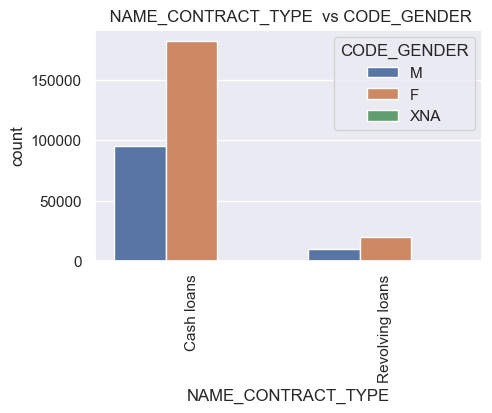

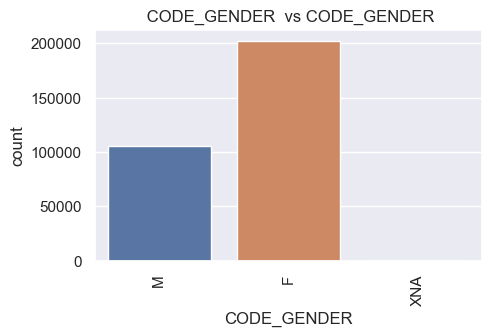

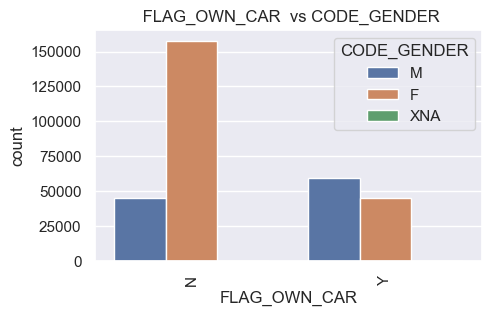

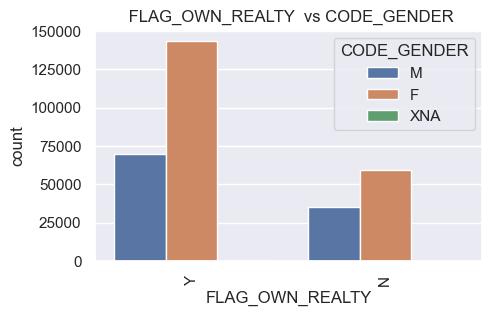

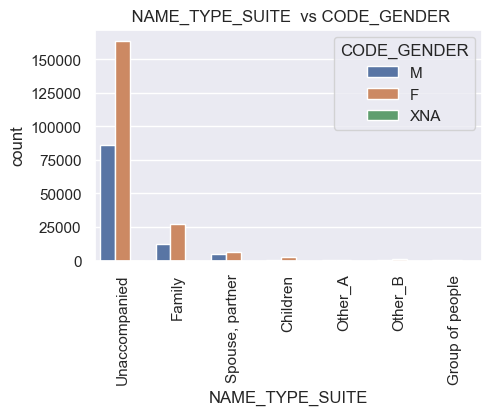

...

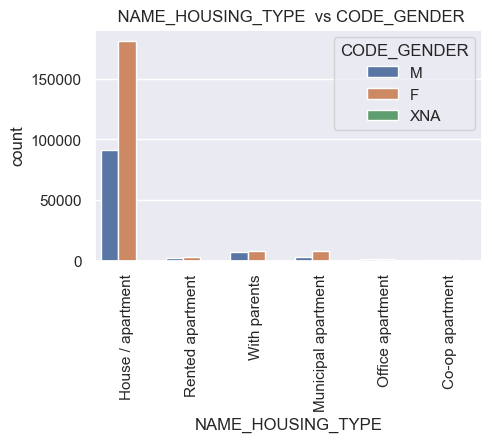

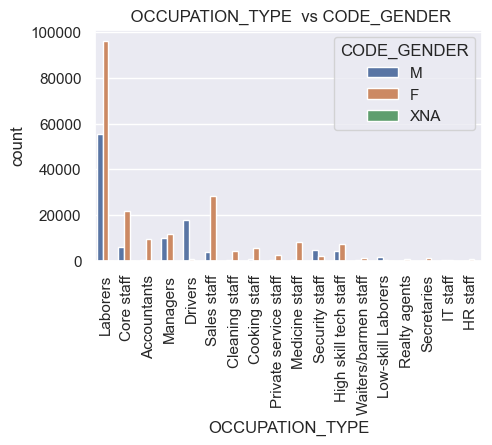

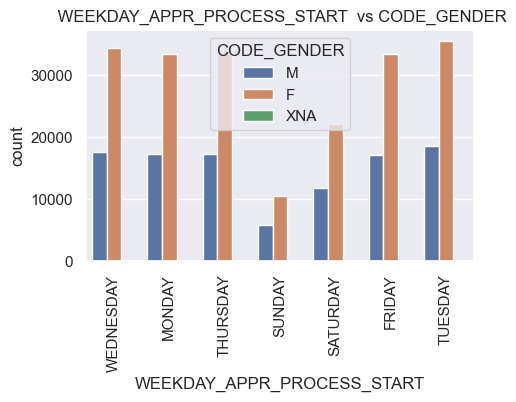

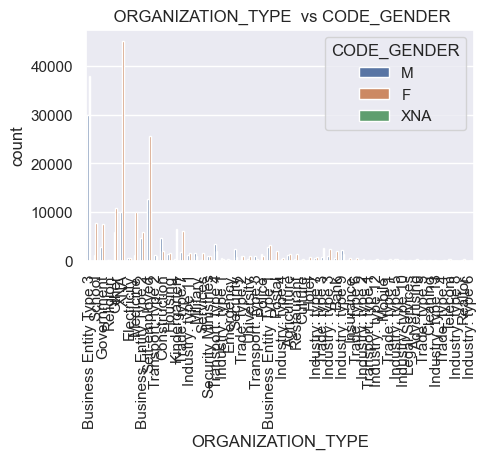

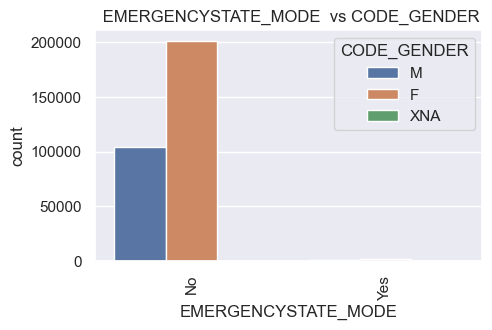

In [105]:
for i in cat_cols:
    plt.figure(figsize=(5,3))
    plt.title(f' {i}  vs CODE_GENDER')
    sns.countplot(x=app[i],hue='CODE_GENDER',data=app)
    plt.xticks(rotation=90)
    plt.show()

### Bivariate Analysis of Categorical Variables with NAME_CONTRACT_TYPE
##### The following countplots show the distribution of different categorical variables across Cash Loans and Revolving Loans. These insights help us understand how different applicant characteristics relate to loan types.

#### FLAG_OWN_CAR vs NAME_CONTRACT_TYPE
##### Among applicants who own a car (Y), more people have Cash Loans than Revolving Loans.
##### Among those who don’t own a car (N), Cash Loans are still the most common, but the difference is smaller.
##### Insight: Car owners are more likely to take Cash Loans rather than Revolving Loans.
#### FLAG_OWN_REALTY vs NAME_CONTRACT_TYPE
##### For applicants who own real estate (Y), Cash Loans are more common than Revolving Loans.
##### For those who don’t own real estate (N), the same trend is observed, but Revolving Loans have a higher proportion.
##### Insight: Owning real estate does not significantly impact the choice of loan type, but Cash Loans remain the most preferred option.
##### NAME_TYPE_SUITE vs NAME_CONTRACT_TYPE
##### Applicants who applied "Unaccompanied" mostly took Cash Loans rather than Revolving Loans.
##### In other categories like "Family", Cash Loans are also more popular.
#### Insight: Regardless of whether applicants are alone or applying with family, Cash Loans are the most preferred option.
#### NAME_INCOME_TYPE vs NAME_CONTRACT_TYPE
##### Among working individuals, Cash Loans dominate.
##### In other income categories (e.g., pensioners, self-employed), Cash Loans are still the most popular.
##### Insight: People from all income types prefer Cash Loans over Revolving Loans, but the proportion varies.
#### NAME_HOUSING_TYPE vs NAME_CONTRACT_TYPE
##### In Housing/Apartment, more applicants take Cash Loans compared to Revolving Loans.
##### Other housing types (e.g., house, municipal apartment) follow the same pattern.
##### Insight: People living in apartments or other housing types prefer Cash Loans, possibly for property-related expenses.
- Summary of Findings:
  * Cash Loans are the dominant loan type across all categories.
  * Car ownership, real estate ownership, and income type do not significantly change loan preference, but Cash Loans remain the first choice.
  * People applying alone or with family both prefer Cash Loans, meaning loan type preference is not influenced much by application status.

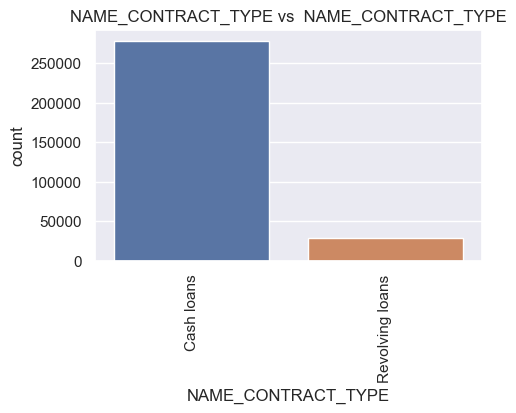

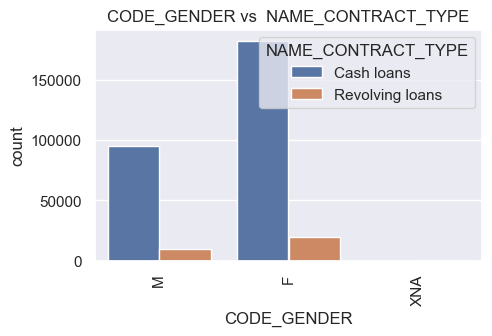

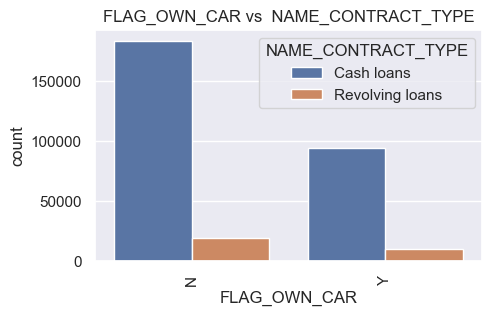

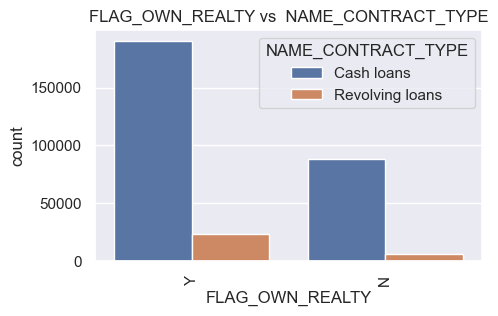

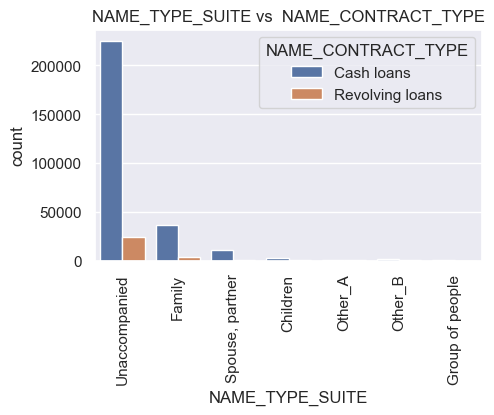

...

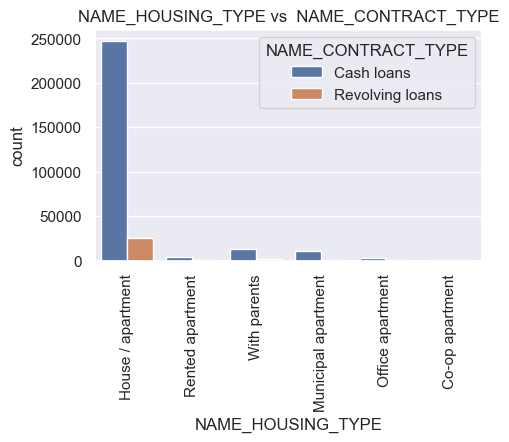

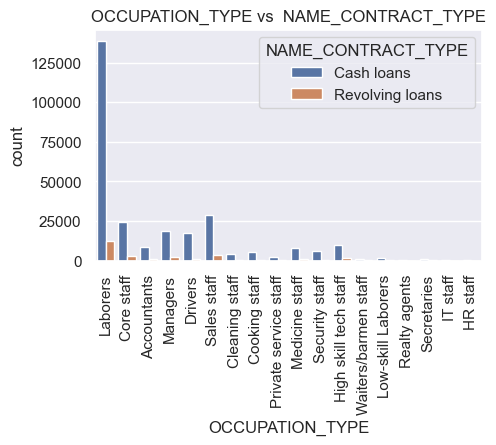

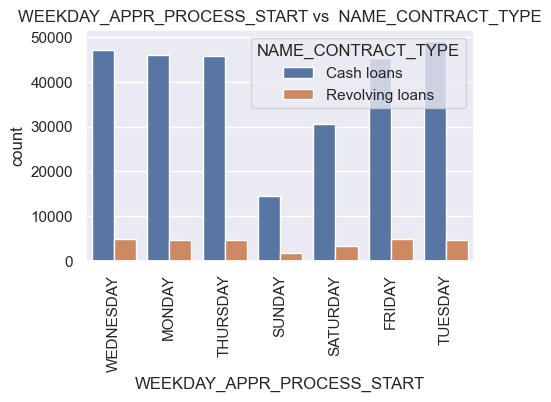

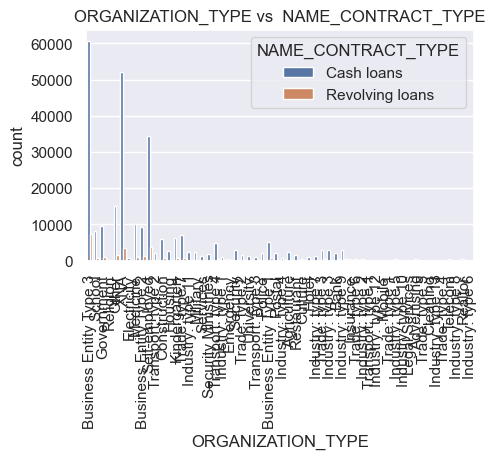

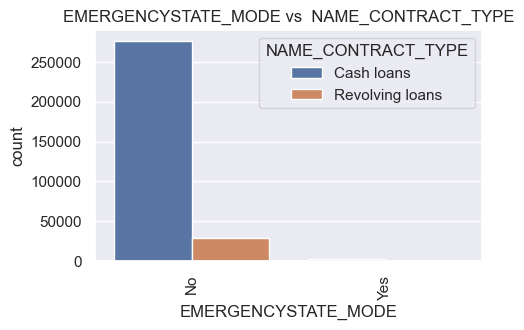

In [107]:
for i in cat_cols:
    plt.figure(figsize=(5,3))
    plt.title(f'{i} vs  NAME_CONTRACT_TYPE')
    sns.countplot(x=app[i],hue='NAME_CONTRACT_TYPE',data=app)
    plt.xticks(rotation=90)
    plt.show()

### 2 Numerical vs Categorical

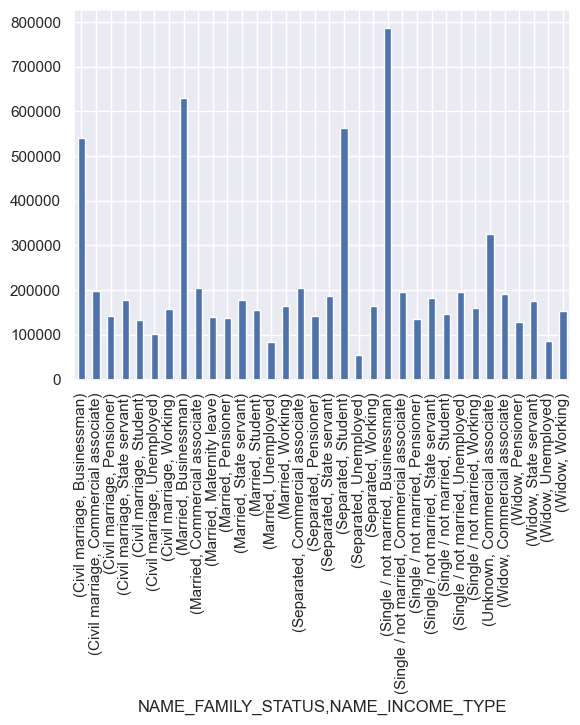

In [109]:
 # those who are single and businessman has more income
app.groupby(['NAME_FAMILY_STATUS','NAME_INCOME_TYPE'])['AMT_INCOME_TOTAL'].mean().plot.bar() # those who are single and businessman has more income
plt.show()

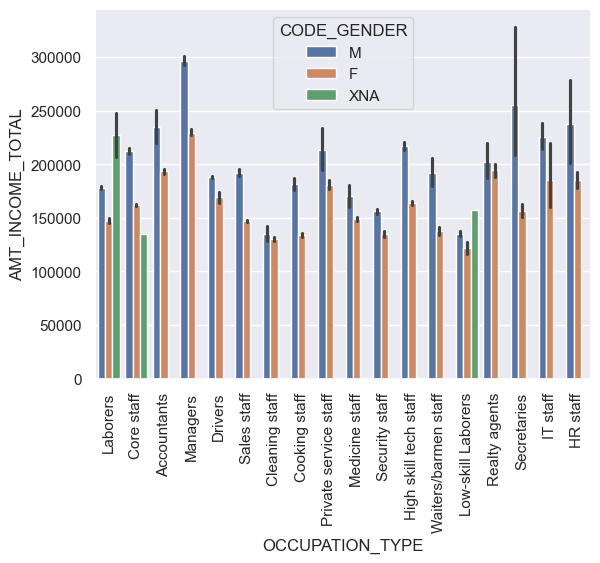

In [110]:
# Then average of Male Managers has more income if we look it seems that in all occuptation_type Male are having more income and  Female are less 
sns.barplot(x='OCCUPATION_TYPE',y='AMT_INCOME_TOTAL',data=app,estimator='mean',hue='CODE_GENDER')
plt.xticks(rotation=90)
plt.show()

### Bivariate Analysis using Violin Plots
##### The following violin plots illustrate the distribution of binary integer columns and other int columns across different loan types (NAME_CONTRACT_TYPE), further divided by gender (CODE_GENDER).

##### What These Plots Show:

##### The spread and density of binary integer columns and other  for each loan type.
##### Gender-wise differences in the distribution of these features.
##### How certain characteristics vary between Cash Loans and Revolving Loans.
##### Key Takeaways:

##### The distribution of binary features varies across loan types and genders.
##### Some features show clear gender-based trends, while others are more evenly distributed.
##### These insights help in understanding differences in loan applicants' characteristics.

In [112]:
int_cols=app.select_dtypes(int).columns


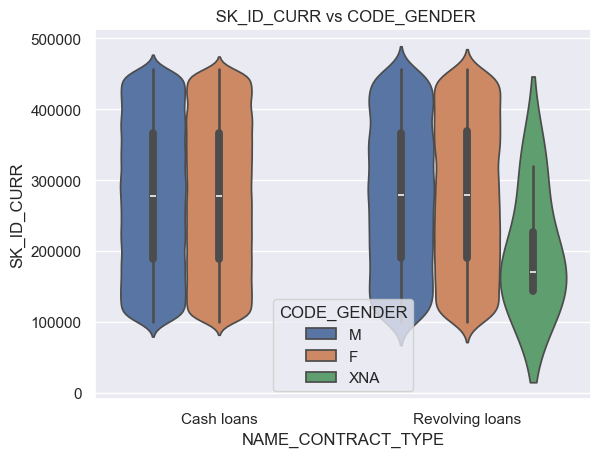

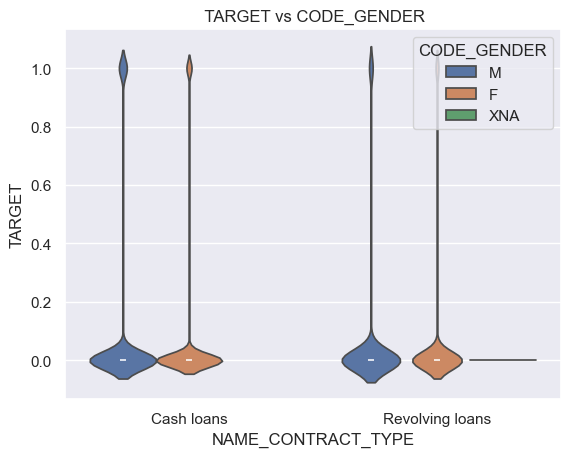

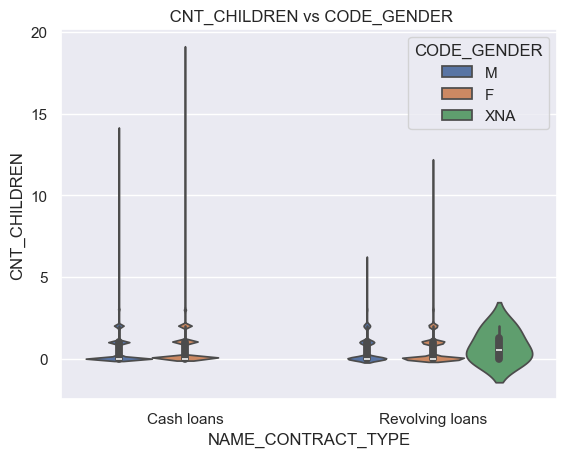

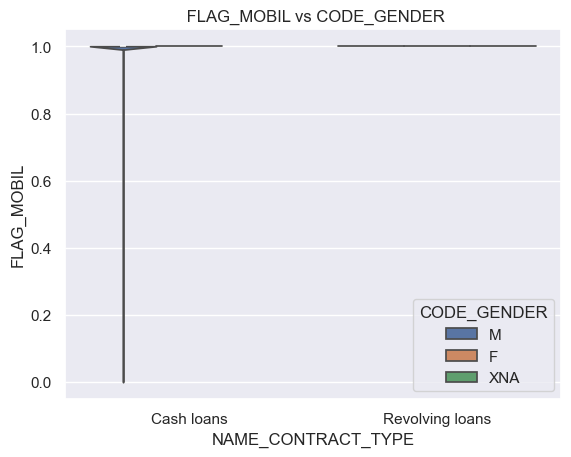

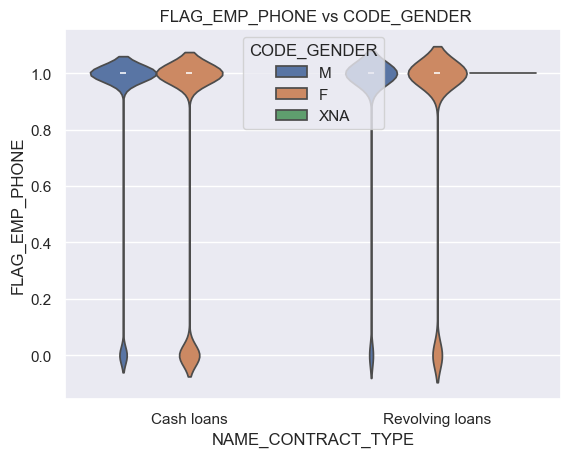

...

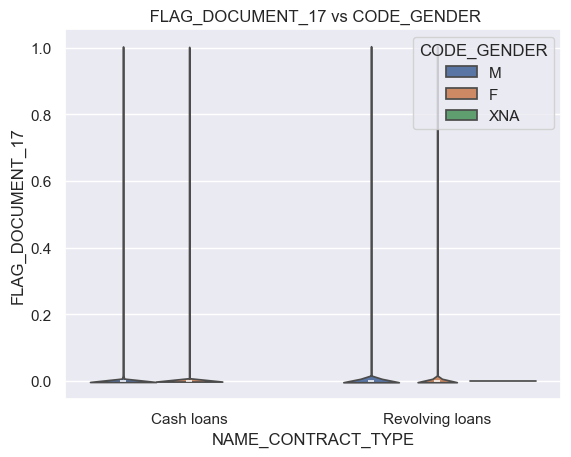

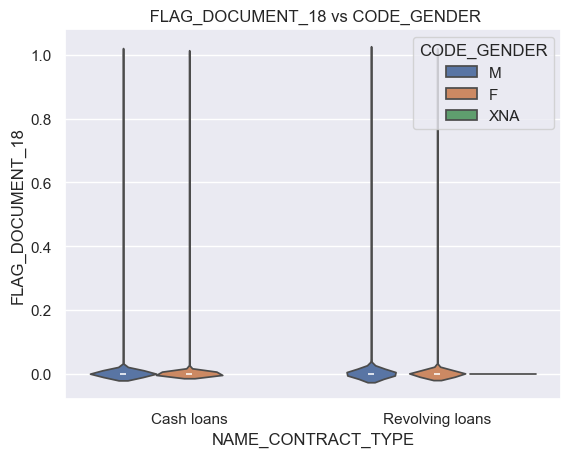

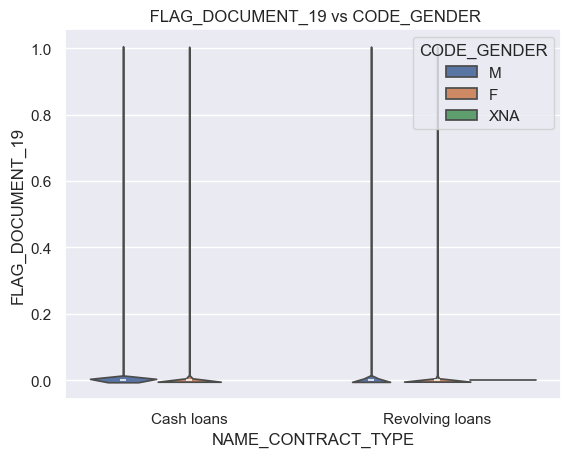

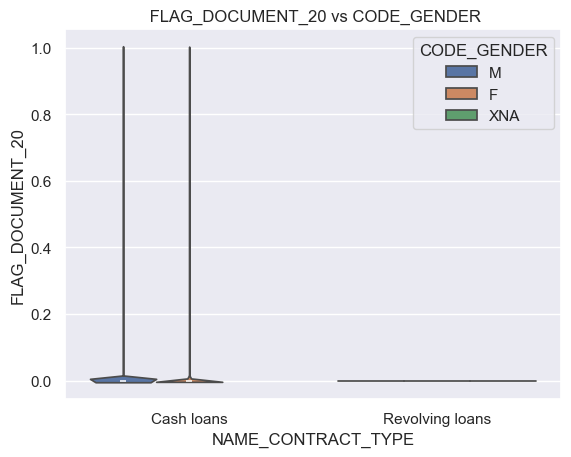

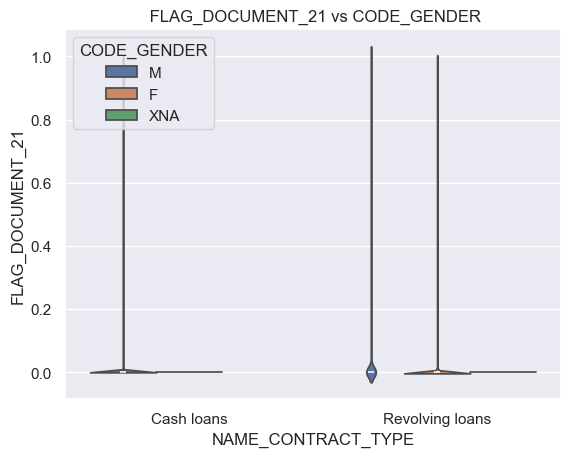

In [113]:
for i in int_cols:
    plt.title(f' {i} vs CODE_GENDER')
    sns.violinplot(y=app[i],x='NAME_CONTRACT_TYPE',data=app,hue='CODE_GENDER')
    plt.show()

# Target colums Analysis 

In [115]:
app.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


### 8.07%  Client with payment difficulties¶
### 91.92% Other


In [117]:
app['TARGET'].value_counts(normalize=True)*100

TARGET
0    91.927118
1     8.072882
Name: proportion, dtype: float64

### Ratio of Target

In [119]:
# Calculate the ratio of records with 'TARGET' value equal to 0 to records with 'TARGET' value equal to 1
(app['TARGET'] == 0).sum() / (app['TARGET'] == 1).sum()

11.387150050352467

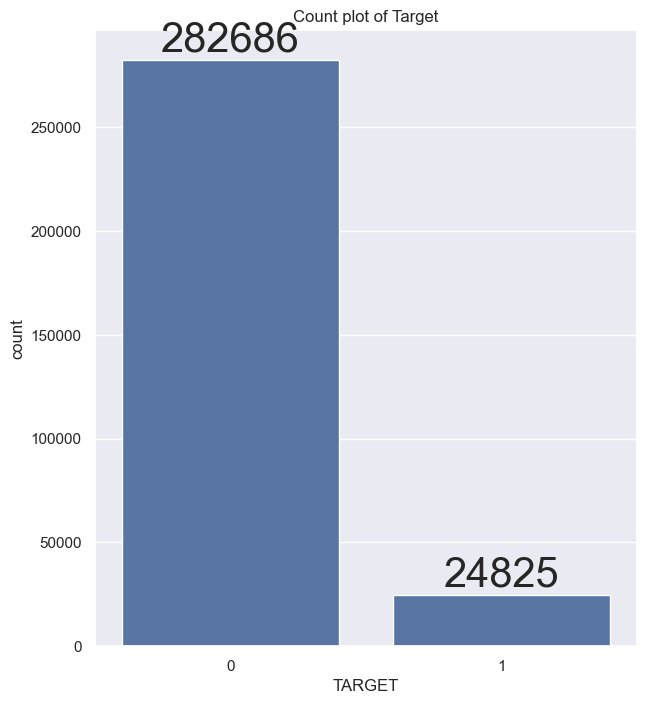

In [120]:
# count of 0 and 1 defult and non defult
plt.figure(figsize=(7,8))
x=sns.countplot(x='TARGET',data=app)
plt.title('Count plot of Target')
x.bar_label(x.containers[0],fontsize=30)
plt.show()

In [121]:
cat_col=app.select_dtypes(object).columns
cat_col

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE'],
      dtype='object')

## Target vs. Categorical Columns Analysis

#### This section provides insights into the relationship between different categorical variables and default payments (Target = 1).

##### NAME_CONTRACT_TYPE:
	•	The majority of default payments occur under Cash Loan contracts.
	•	This indicates that individuals with cash loans are more likely to default compared to those with revolving loans.

##### CODE_GENDER:
	•	Females have a higher default rate compared to males in the dataset.
	•	This suggests that gender may play a role in the likelihood of default.

##### FLAG_OWN_CAR:
	•	Individuals who do not own a car have a higher default rate compared to those who own a car.
	•	This may indicate that car ownership is associated with better financial stability.

##### FLAG_OWN_REALTY:
	•	Unlike car ownership, individuals who own real estate tend to have a higher default rate than those who do not.
	•	This suggests that real estate ownership does not necessarily correlate with lower default risk.

##### NAME_TYPE_SUITE:
	•	Individuals categorized as “Unaccompanied” have the highest default rate.
	•	This implies that people applying for loans alone may have a higher risk of default compared to those with family or friends

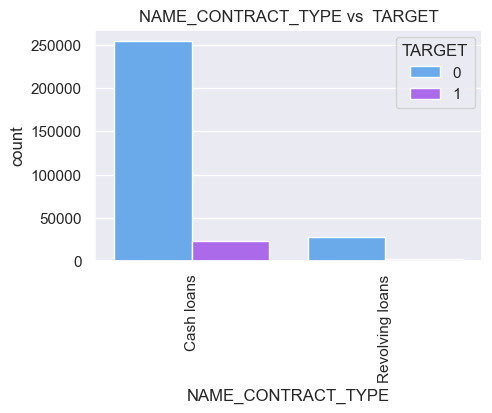

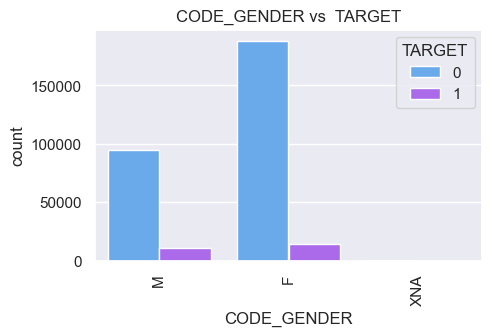

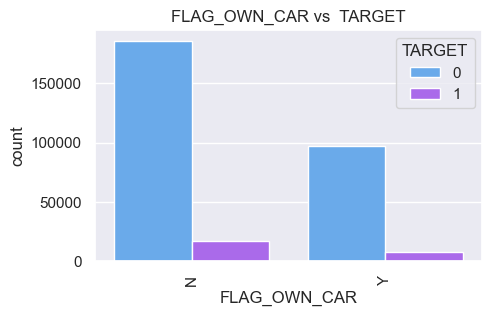

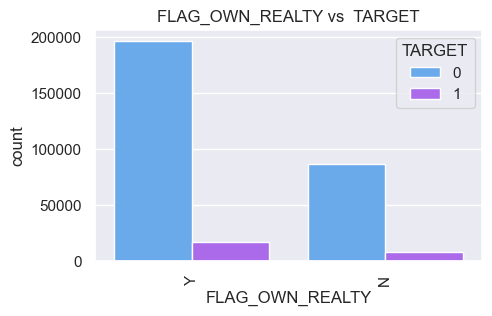

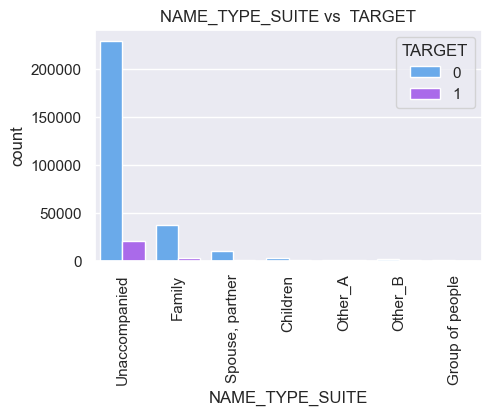

...

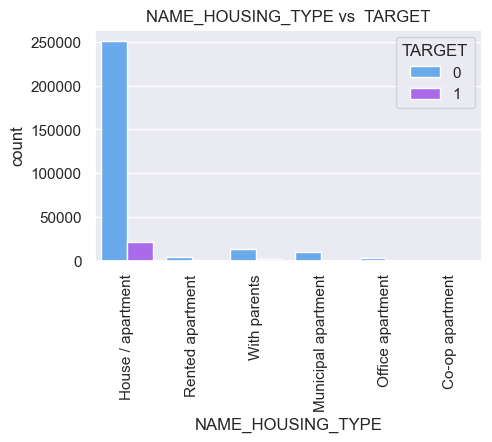

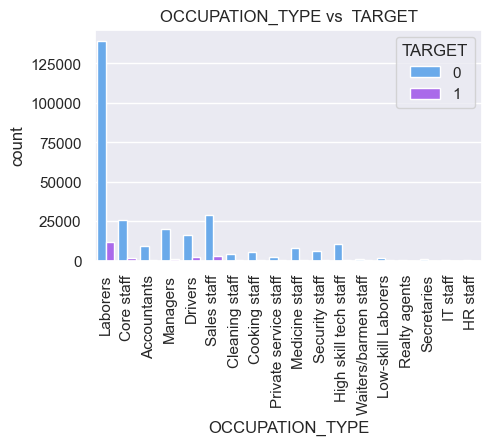

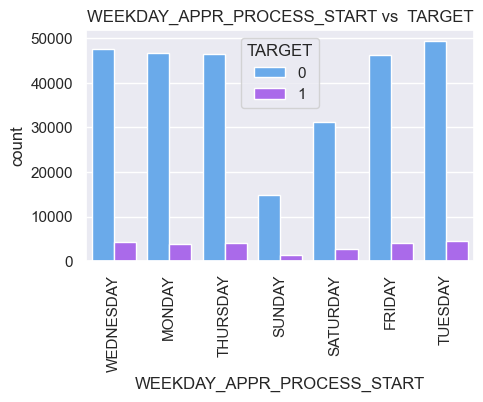

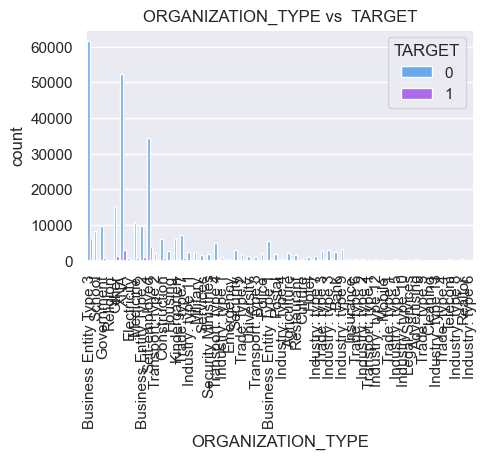

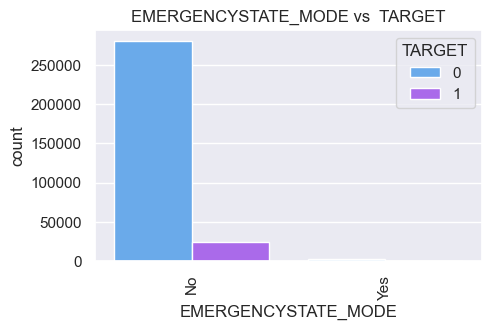

In [123]:
for i in cat_col:
    plt.figure(figsize=(5,3))
    plt.title(f'{i} vs  TARGET')
    sns.countplot(x=app[i],hue='TARGET',data=app,palette='cool')
    plt.xticks(rotation=90)
    plt.show()

In [124]:
app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']]

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE
0,202500.0,406597.5,24700.5,351000.0
1,270000.0,1293502.5,35698.5,1129500.0
2,67500.0,135000.0,6750.0,135000.0
3,135000.0,312682.5,29686.5,297000.0
4,121500.0,513000.0,21865.5,513000.0
...,...,...,...,...
307506,157500.0,254700.0,27558.0,225000.0
307507,72000.0,269550.0,12001.5,225000.0
307508,153000.0,677664.0,29979.0,585000.0
307509,171000.0,370107.0,20205.0,319500.0


### Bivariate Analysis using Bar Plot (Groupby + Aggregation)
#### The bar plot below represents the mean values of key financial features (AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE) for each gender (CODE_GENDER)
##### Males have higher values in all financial attributes:
##### AMT_INCOME_TOTAL - Males have higher average income.
##### AMT_CREDIT - Males receive higher loan amounts.
##### AMT_ANNUITY - Males pay higher annuities.
##### AMT_GOODS_PRICE - Males finance more expensive goods.
##### This could indicate that male applicants are approved for larger credit amounts on average.
* Possible Interpretation:
  * Males might be applying for or qualifying for higher loan amounts due to higher income levels or different risk assessments.
  * Credit policies and eligibility criteria might differ slightly based on financial stability metrics.

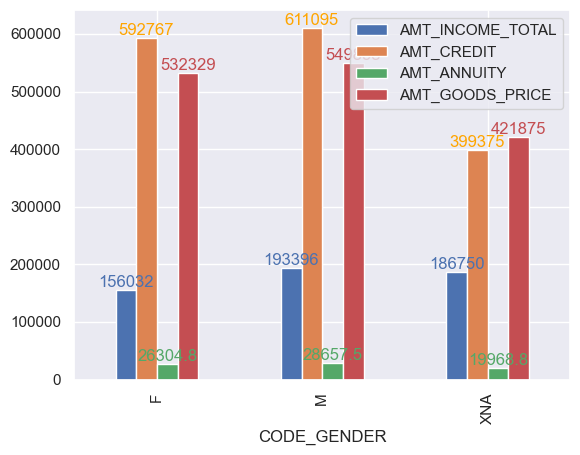

In [126]:
x=app.groupby('CODE_GENDER').agg({'AMT_INCOME_TOTAL':'mean',
                                'AMT_CREDIT':'mean', 
                                'AMT_ANNUITY':'mean',
                               'AMT_GOODS_PRICE':'mean'}).plot.bar(stacked=False)
plt.bar_label(x.containers[0],color='b')
plt.bar_label(x.containers[1],color='orange')
plt.bar_label(x.containers[2],color='g')
plt.bar_label(x.containers[3],color='r')


plt.show()

# Multivariate Analysis: Correlation & Pairplot Analysis

#### In this multivariate analysis, we examine the relationships among the financial attributes:
	•	AMT_INCOME_TOTAL
	•	AMT_CREDIT
	•	AMT_ANNUITY
	•	AMT_GOODS_PRICE

### Correlation Heatmap

#### The heatmap displays the correlation between numerical variables.

##### Key Insights:
 • Strong correlation (0.99) between AMT_CREDIT and AMT_GOODS_PRICE, indicating that loan amounts are closely tied to the value of goods  
 financed.   
 
 • Moderate correlation (0.77) between AMT_CREDIT and AMT_ANNUITY, suggesting that higher loans lead to higher annuity payments.
 
 • Weak correlation (0.16-0.19) between AMT_INCOME_TOTAL and other financial variables, implying that income does not have a strong direct 
    impact on loan or annuity amounts.

##### Pairplot Analysis

#### The pairplot visualizes scatter plots and distributions among these numerical features.

##### Key Insights:
 • Linear relationships are visible between AMT_CREDIT, AMT_ANNUITY, and AMT_GOODS_PRICE, confirming the strong correlations seen in the 
    heatmap.
    
 • Income distribution is skewed, with a few outliers having significantly higher incomes.
    
 • Loan amounts cluster in specific ranges, possibly indicating standardized credit policies

<Axes: >

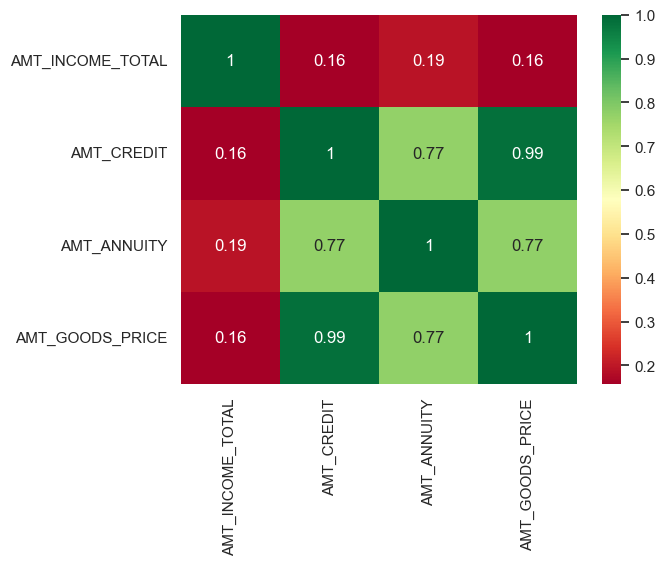

In [128]:
sns.heatmap(app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']].corr(),annot=True,cmap='RdYlGn')

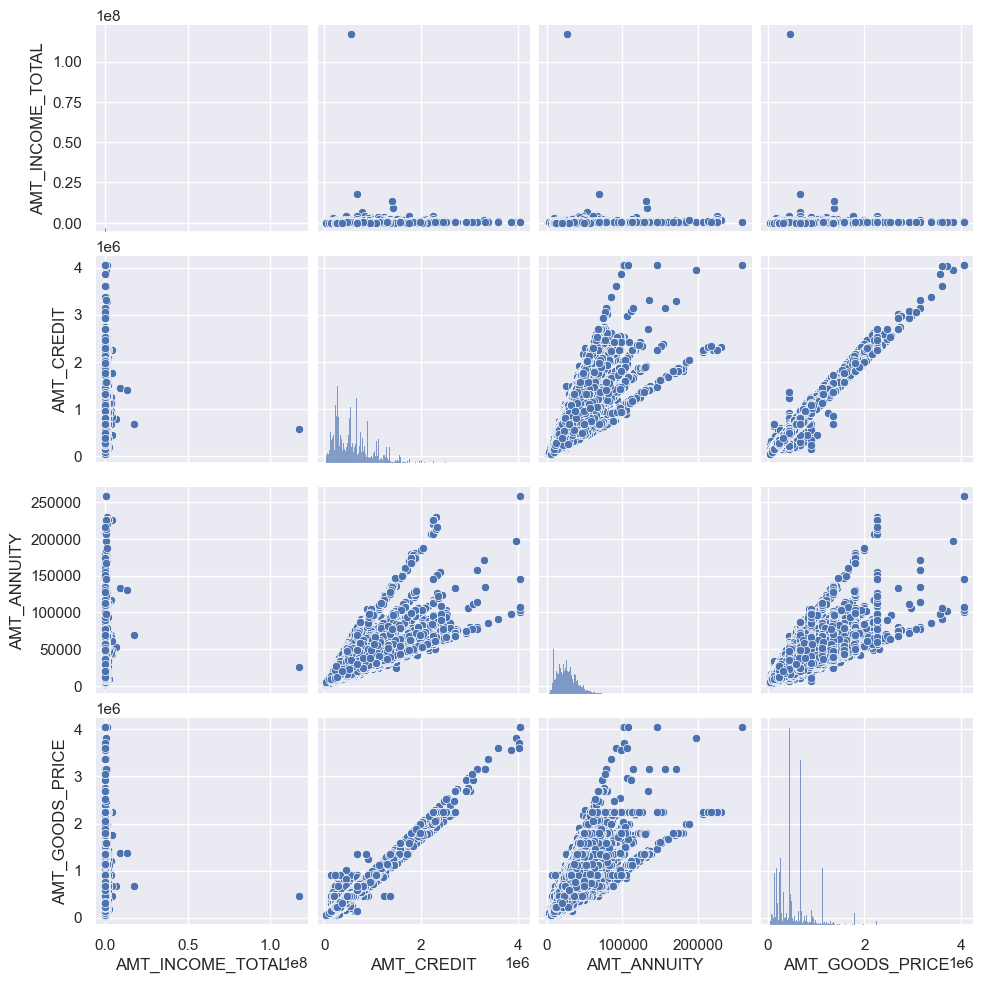

In [129]:
sns.pairplot(app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']])
plt.show()

# Corr between all Numeric columns 
## Insights from the Heatmap:
####    1. Strong Correlations Between Some Features:
	•	AMT_GOODS_PRICE and AMT_INCOME_TOTAL likely have a strong positive correlation, meaning that as the price of goods increases, the total income of applicants also tends to be higher.
	•	YEARS_BEGINEXPLUATATION_AVG and FLOORSMAX_MODE may also show a high correlation, as newer buildings often have more floors.
####	2.	Weak or No Correlation Between Many Variables:
	•	Features like FLAG_MOBIL, FLAG_CONT_MOBILE, and HOUR_APPR_PROCESS_START likely have little to no correlation with financial indicators   
    such as income or loan amounts.
	•	This suggests that these variables may not be strong predictors for credit risk.
####	3.	Possible Multicollinearity Issues:
	•	If some variables, such as AMT_GOODS_PRICE and AMT_CREDIT, are highly correlated, it might indicate redundancy in the dataset.
	•	Multicollinearity can affect model performance, so highly correlated features should be checked before model building.
####	4.	Negative Correlations:
	•	DAYS_EMPLOYED may have a negative correlation with AMT_REQ_CREDIT_BUREAU_DAY or AMT_REQ_CREDIT_BUREAU_QRT, meaning that people who have 
    been employed for longer tend to have fewer recent credit inquiries.
	•	This could indicate that stable employment reduces the need for multiple loan applications.
####	5.	Document Flags Are Not Highly Correlated:
	•	The FLAG_DOCUMENT_X variables (e.g., FLAG_DOCUMENT_2, FLAG_DOCUMENT_5, etc.) likely do not have strong correlations with financial 
    metrics.
	•	This suggests that document submission patterns do not significantly impact credit risk prediction

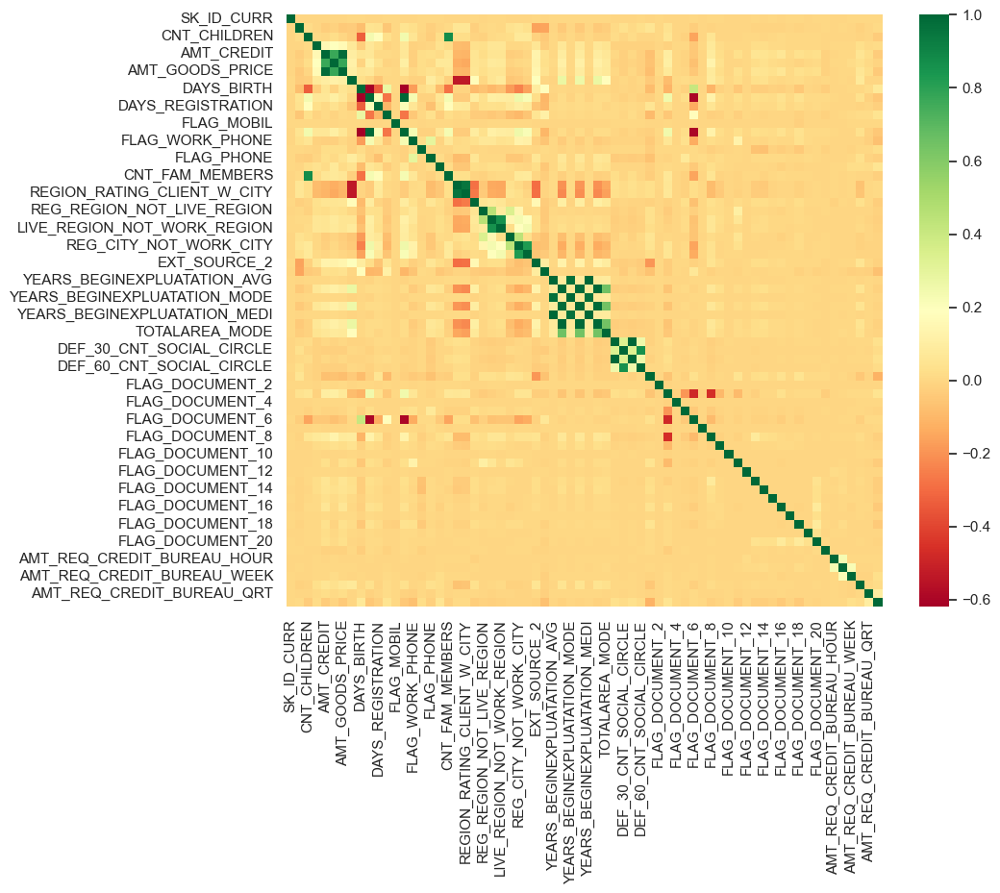

In [131]:
plt.figure(figsize=(10,8))
x=app.corr(numeric_only=True)
sns.heatmap(x,cmap='RdYlGn')
plt.show()

# 5. Merging Previous Application Data 
    1 - Understand the data
    2 - Merge with Current application 
    3 - EDA

##### 1 Understand the data

In [134]:
previous_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [135]:
previous_app.shape

(1670214, 37)

In [136]:
app.shape

(307511, 81)

In [137]:
previous_app.isna().mean()*100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [138]:
# delete columns which has more or equal 50% of null values because some columns has 99% null values 
previous_app=previous_app.loc[:,previous_app.isna().mean()<=.50]

In [139]:
previous_app.isna().mean()*100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYPE               0.000000
CHANNEL_TYPE                    0.000000
SELLERPLACE_AREA                0.000000
NAME_SELLER_INDUSTRY            0.000000
CNT_PAYMENT     

In [140]:
previous_app.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,1.284699e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,2.278473e+05,1.248418e+01,9.964675e-01,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,3.153966e+05,3.334028e+00,5.932963e-02,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,5.084100e+04,1.000000e+01,1.000000e+00,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.123200e+05,1.200000e+01,1.000000e+00,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,2.340000e+05,1.500000e+01,1.000000e+00,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,6.905160e+06,2.300000e+01,1.000000e+00,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


##### 2 Merge with current application

In [142]:
# Merge 'app' DataFrame with 'previous_app' DataFrame based on 'SK_ID_CURR'
# Using 'inner' join to retain only common rows between the two DataFrames
pre_app = app.merge(previous_app, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [152]:
pre_app['TARGET'].value_counts(normalize=True)*100

TARGET
0    91.344704
1     8.655296
Name: proportion, dtype: float64

In [146]:
pre_app.

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1413696,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,XNA,24.0,middle,Cash X-Sell: middle,365243.0,-618.0,72.0,-558.0,-528.0,1.0
1413697,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Connectivity,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
1413698,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,XNA,60.0,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN
1413699,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,XNA,36.0,low_normal,Cash X-Sell: low,365243.0,-756.0,294.0,-66.0,-64.0,0.0


In [ ]:
pre_app.columns

In [ ]:
pre_app.select_dtypes(float).columns

In [ ]:
pre_app[['AMT_CREDIT_x','AMT_ANNUITY_x','AMT_GOODS_PRICE_x']]

#### The correlation heatmap shows the relationships between the variables in both datasets. Key observations include:
	• Strong correlations between AMT_CREDIT, AMT_ANNUITY, and AMT_GOODS_PRICE in both previous and current applications.
    
	•  A relatively weaker correlation between past and present credit amounts, indicating possible variations in customer borrowing behavior      over time

In [ ]:
sns.heatmap(pre_app[['AMT_CREDIT_y','AMT_ANNUITY_y','AMT_GOODS_PRICE_y','AMT_CREDIT_x','AMT_ANNUITY_x','AMT_GOODS_PRICE_x']].corr(),annot=True,cmap='RdYlGn')

In [ ]:
pre_app.select_dtypes(object).columns

### Contract Type by Gender (Current vs Previous Applications)
#### The count plots compare the distribution of contract types (NAME_CONTRACT_TYPE) for male and female applicants in current and previous applications.

#### Key Observations:

##### In current applications, females dominate cash loans, with fewer males.
##### In previous applications, the trend is similar:
##### Females were also more likely to take cash loans.
##### Additionally, in consumer loans, females had a higher share.
##### This suggests that women consistently apply for cash loans more frequently than men across different time periods.
#### Possible Interpretation:

##### The preference for cash loans among females may be due to financial needs, ease of approval, or loan terms.
##### The higher share of consumer loans in previous applications might indicate a shift in borrowing patterns over time.

In [ ]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.title('Count of current application NAME_CONTRACT_TYPE vs CODE GENDER')
sns.countplot(x='NAME_CONTRACT_TYPE_x',data=pre_app,hue='CODE_GENDER')
plt.figure(figsize=(8,4))
plt.subplot(1,2,2)
plt.title('Count of previous application NAME_CONTRACT_TYPE VS CODE GENDER')
plt.xticks(rotation=90)
sns.countplot(x='NAME_CONTRACT_TYPE_y',data=pre_app,hue='CODE_GENDER')
plt.show()

# 6. Conclusion
##### In this project, we analyzed loan application data by performing data cleaning, preprocessing, and exploratory data analysis (EDA). Through univariate, bivariate, and multivariate analysis, we gained insights into applicant behavior, financial attributes, and gender-based trends.

#### Key findings include:

##### Females applied for more cash loans in both current and previous applications.
##### Males had higher average income, credit amounts, annuities, and goods prices.
##### Consumer loans were more common in previous applications, showing a shift in borrowing trends.
##### Merging previous applications with current ones helped in understanding long-term patterns in loan approvals and applicant behavior.
##### These insights are valuable for financial institutions to improve credit risk assessment, loan policies, and customer-focused financial products. Understanding gender-based and financial trends can help optimize loan approval strategies and risk management.